In [5]:
import os, copy
import glob
import logging

import numpy as np
import scipy.optimize as so
import pandas as pd
import xarray as xr
import rioxarray as rxr
import datetime as dt
import cartopy.crs as ccrs

import netCDF4
import h5py
from osgeo import gdal

#%matplotlib widget
import matplotlib as mpl
import matplotlib.pyplot as plt
import colorcet as cc


import hgrs
import hgrs.driverEnMAP as driverEnMAP

opj = os.path.join
hgrs.__version__

'1.1.0'

### Set PRISMA file paths
Give path for L1C (L2C is normally in the same directory). The L2C is needed to get the viewing geometry parameters (viewing zenith angle, sun zenith angle and relative azimuth)


In [6]:

cams_dir = '/data/cams/world/'
odir = '/data/satellite/enmap/l2a'
l1c_dir= '/data/satellite/enmap/EnMAP_L1C/AAOT'
l1c_paths =glob.glob(opj(l1c_dir,'ENMAP*Z'))
l1c_paths

['/data/satellite/enmap/EnMAP_L1C/AAOT/ENMAP01-____L1C-DT0000141797_20250704T104344Z_003_V010502_20250715T181045Z',
 '/data/satellite/enmap/EnMAP_L1C/AAOT/ENMAP01-____L1C-DT0000001199_20220623T104348Z_016_V010502_20250308T051722Z',
 '/data/satellite/enmap/EnMAP_L1C/AAOT/ENMAP01-____L1C-DT0000049235_20231107T105849Z_003_V010502_20250130T134329Z',
 '/data/satellite/enmap/EnMAP_L1C/AAOT/ENMAP01-____L1C-DT0000029821_20230729T104016Z_002_V010502_20250130T132154Z',
 '/data/satellite/enmap/EnMAP_L1C/AAOT/ENMAP01-____L1C-DT0000068034_20240408T102534Z_002_V010502_20250121T114551Z',
 '/data/satellite/enmap/EnMAP_L1C/AAOT/ENMAP01-____L1C-DT0000001704_20220716T104012Z_015_V010502_20250130T025935Z',
 '/data/satellite/enmap/EnMAP_L1C/AAOT/ENMAP01-____L1C-DT0000150903_20250907T102940Z_002_V010502_20250930T104017Z',
 '/data/satellite/enmap/EnMAP_L1C/AAOT/ENMAP01-____L1C-DT0000021765_20230609T104401Z_002_V010502_20250130T132154Z',
 '/data/satellite/enmap/EnMAP_L1C/AAOT/ENMAP01-____L1C-DT0000012881_2023

In [7]:
l1c_path = l1c_paths[-1]
basename = os.path.basename(l1c_path)
l2a_path = opj(odir,basename.replace('L1C','L2A')+'.nc')
#if os.path.exists(l2a_path):
#    continue
driver = hgrs.Driver('enmap')

l1c_prod = driver.driver(l1c_path,reflectance_unit=True)
l1c_prod.Rtoa.load()
date_str = str(l1c_prod.time.dt.strftime('%Y-%m').values)
cams_path = opj(cams_dir,f'cams_forecast_{date_str}.nc')

raster = l1c_prod.sza.rio.reproject(4326)
clon, clat = float(raster.x.mean()),float(raster.y.mean())

lut_file='/DATA/git/satellite_app/hgrs/data/lut/opac_osoaa_lut_v3_light.nc'
lut_file='/data/vrtc/xlut/toa_lut_opac_wind_up_v3.nc'

aero_lut = xr.open_dataset(lut_file).isel(wind=1).drop_sel(model='URBA_rh70').squeeze()
aero_lut['wl'] = aero_lut['wl'] * 1000

date = l1c_prod.time

# -----------------------------------------
# Create hGRS object
# -----------------------------------------
logging.info('Create hGRS object')
prod = hgrs.Algo(l1c_prod, expon=1.8, xcoarsen=20, ycoarsen=20)
prod.round_angles()

prod.aero_lut = aero_lut

# -----------------------------------------
# get CAMS and set atmospheric parameters
# -----------------------------------------
logging.info('get CAMS and set atmospheric parameters')
# lazy loading
cams = xr.open_dataset(cams_path, decode_cf=True,
                       chunks={'time': 1, 'x': 500, 'y': 500})
# slicing
#
cams = cams.sel(latitude=clat, longitude=clon, method='nearest')
# fix for new ADS format (sept 2024)
if ('forecast_period' in cams.dims) & ('forecast_reference_time' in cams.dims):
    cams = cams.stack(time_buffer=['forecast_period', 'forecast_reference_time']).swap_dims(
        {'time_buffer': 'valid_time'}).sortby('valid_time').rename(
        {'valid_time': 'time'}).drop_vars(['time_buffer'])

cams = cams.sel(time=date, method='nearest')

# select OPAC aerosol model
# aod = cams[['aod355', 'aod380', 'aod400', 'aod440', 'aod469', 'aod500', 'aod550', 'aod645', 'aod670',
#            'aod800', 'aod865', 'aod1020', 'aod1064', 'aod1240', 'aod1640', 'aod2130']].to_pandas()
# aod.index = aod.index.str.replace('aod', '').astype(int)
# cams_aod = aod.to_xarray().rename({'index': 'wl'})
cams_wls = [469, 550, 670, 865, 1240]
param_aod = []
for wl in cams_wls:
    wl_ = str(wl)
    param_aod.append('aod' + wl_)

cams_aod = cams[param_aod].to_array(dim='wl')

wl_cams = cams_aod.wl.str.replace('aod', '').astype(float)
cams_aod = cams_aod.assign_coords(wl=wl_cams)

# new LUT:

lut_aod = aero_lut.aot.sel(aot_ref=1).interp(wl=cams_aod.wl)
idx = np.abs((cams_aod / cams.aod550) - lut_aod).sum('wl').argmin()
opac_model = aero_lut.model.values[idx]
print(opac_model)

# set gases and pressure
prod.pressure = float(cams.sp) * 1e-2
prod.to3c = float(cams.gtco3)
prod.tno2c = float(cams.tcno2)
prod.tch4c = float(cams.tc_ch4)

# -----------------------------------------
# Apply pixel classification / masking
# -----------------------------------------
logging.info('Apply water masking')
prod.apply_water_masks()
logging.info('Apply omnicloudmask')
red_index = 670
green_index = 550
nir_index = 940
rgnir = prod.raster.Rtoa.sel(wl=[red_index, green_index, nir_index], method='nearest').fillna(0)  # .values
omnimask = prod.get_omnicloudmask(rgnir)
prod.raster['Rtoa'] = prod.raster['Rtoa'].where(omnimask==0)

# -----------------------------------------
# Construct coarse resolution raster
# -----------------------------------------
logging.info('Construct coarse resolution raster')
prod.get_coarse_masked_raster()
# prod.plot_water_pix_number()

# -----------------------------------------
# Correct for gaseous absorption
# -----------------------------------------
logging.info('Correct for gaseous absorption')
prod.get_gaseous_transmittance()
prod.other_gas_correction()

logging.info('water vapor retrieval and correction')
wv_retrieval = hgrs.WaterVapor(prod)
wv_retrieval.solve()

prod.get_wv_transmittance_raster(wv_retrieval.water_vapor)
prod.water_vapor_correction()

logging.info('mask bands where gaseous abs. is too strong')
Tg_tot = prod.Tg_other*prod.Twv_raster.mean(['x','y'])


INFO:root:Create hGRS object
INFO:root:Load pre-computed radiative transfer LUT
INFO:root:get CAMS and set atmospheric parameters
INFO:root:Apply water masking


WASO_rh0


INFO:root:Apply omnicloudmask
/home/harmel/anaconda3/envs/py12/lib/python3.12/site-packages/omnicloudmask/cloud_mask.py:254: UserWarning: Significant no-data areas detected. Adjusting patch size to 608px and overlap to 300px to minimize no-data patches.
  patch_overlap, patch_size = check_patch_size(
INFO:root:Construct coarse resolution raster
INFO:root:Correct for gaseous absorption
INFO:root:water vapor retrieval and correction
INFO:root:mask bands where gaseous abs. is too strong


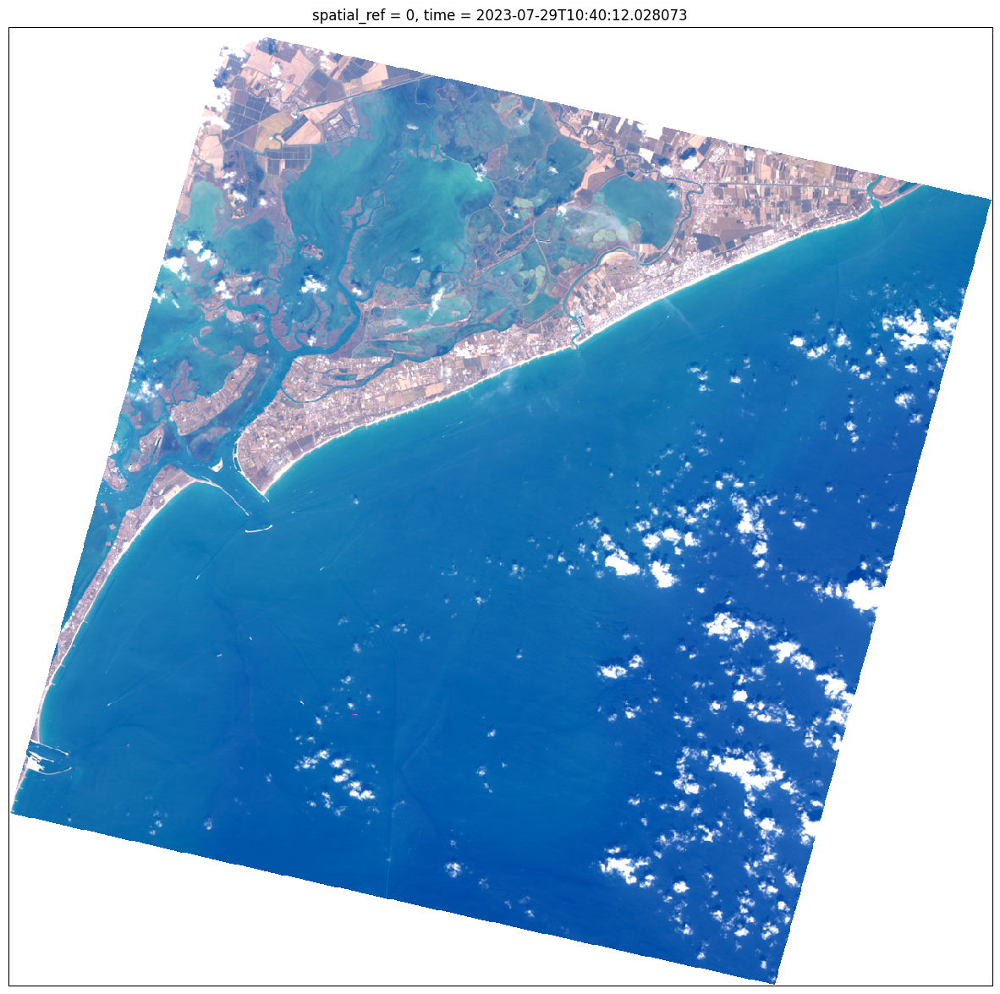

In [8]:
str_epsg = str(l1c_prod.rio.crs)
crs = l1c_prod.rio.crs
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)

coarsening=1
gamma=0.2
brightness_factor = 1
plt.figure(figsize=(15,15))
fig = (l1c_prod.Rtoa[:, ::coarsening, ::coarsening].sel(wl=[705,560,460],method='nearest')**gamma*brightness_factor).plot.imshow(rgb='wl',robust=True, subplot_kws=dict(projection= proj))
fig.axes.set(xticks=[], yticks=[])
fig.axes.set_ylabel('')
fig.axes.set_xlabel('')
fig

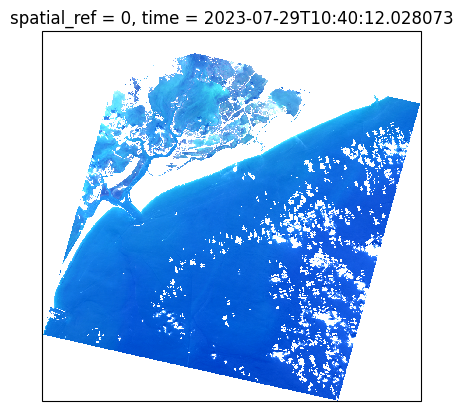

In [9]:
prod.raster.Rtoa.sel(wl=[705,560,460],method='nearest').plot.imshow(rgb='wl',robust=True, subplot_kws=dict(projection= proj))


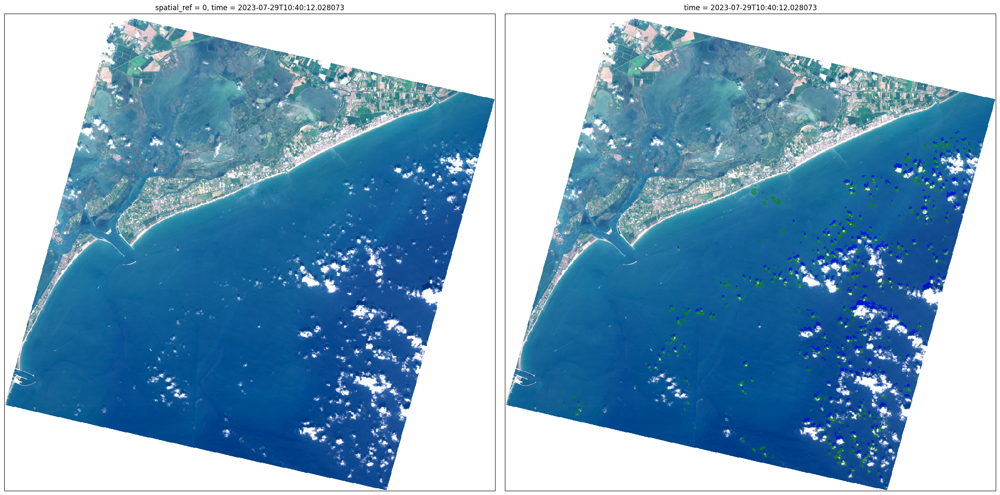

In [10]:
alpha=0.6
fig,axs=plt.subplots(ncols=2,figsize=(30,15),subplot_kw={'projection': proj})
fig.subplots_adjust(wspace=0.02)
ax=axs

rgb=(l1c_prod.Rtoa.sel(wl=[665,560,490],method='nearest')**0.2)
rgb.plot.imshow(rgb='wl', robust=True,ax=axs[0])
rgb.plot.imshow(rgb='wl', robust=True,ax=axs[1])

bcmap = mpl.colors.ListedColormap([(0,0,0,0),'green','orange','blue'])
omnimask.plot.imshow(cmap=bcmap,alpha=alpha,add_colorbar=False,ax=axs[1])

In [11]:
# ------------------------------------------
# aerosol retrieval
# ------------------------------------------
logging.info('aerosol retrieval')

variable = 'Rtoa'
prod.coarse_masked_raster = prod.remove_wl_dataset(
    prod.coarse_masked_raster, prod.wl_to_remove, variable=variable)

# remove bands where Tg is below a threshold (typically Tg < 0.5)
prod.coarse_masked_raster[variable] = prod.coarse_masked_raster[variable].where(Tg_tot>0.5,drop=True)
prod.raster[variable] = prod.raster[variable].where(Tg_tot>0.5,drop=True)

# TODO double check regularization from CAMS AOT values
aod550_mean = cams.aod550.mean().values

aod550_std = cams.aod550.std().values
aod550_std = np.max([aod550_std, 0.2 * aod550_mean+0.05])
aot550_min = 0.002# np.max([aod550_mean - 2*aod550_std,0.001])
aero_retrieval = hgrs.Aerosol(prod,
                              aerosol_model=opac_model,
                              first_guess=[aod550_mean, 0.],
                              aot550_limits=[aot550_min,
                                             aod550_mean + aod550_std])
aero_retrieval.solve()
self = aero_retrieval
self.prepare_lut(prod.coarse_masked_raster.wl)
self.smoothing()

#self.aero_img['aot_ref_smoothed']=self.aero_img['aot_ref_smoothed']*0.5
# construct aot raster
# with full res
#aot_ref_vals = self.aot_ref_full.round(3)
# with coarse res
aot_ref_vals = self.aero_img['aot_ref_smoothed'].round(3)
aot_refs = np.unique(aot_ref_vals)
aot_refs = aot_refs[~np.isnan(aot_refs)]
# TODO update LUT for aot< 0.001
aot_refs[aot_refs<0.002]=0.002
# if rounded aot_ref has unique value
if len(aot_refs) == 1:
    aot_refs = np.concatenate([ aot_refs, 1.2 * aot_refs])
aots = self.aot_lut.interp(aot_ref=aot_refs, method='linear')
aots = aots.interp(aot_ref=aot_ref_vals, method='nearest')

aots.name = 'aot'
aots.attrs['description'] = 'spectral aerosol optical thickness'

# construct raster for diffuse atmospheric reflectance
Rdiffs = self.Rtoa_lut.interp(aot_ref=aot_refs, method='linear')
Rdiffs = Rdiffs.interp(aot_ref=aot_ref_vals, method='nearest')
Rdiffs.name = 'Rtoa_diff'
Rdiffs.attrs['description'] = 'top-of-atmosphere atmosphere reflectance'



# construct raster for direct transmittance due to rayleigh and aerosol
Tdirs = self.transmittance_dir(aots, self.air_mass, rot=self.rot)
Tdirs.name = 'Tdir'
Tdirs.attrs['description'] = 'direct transmittance due to rayleigh and aerosol for total air mass'


aero_retrieval.get_atmo_parameters(prod.coarse_masked_raster.wl)

INFO:root:aerosol retrieval


In [12]:
prod.wl_atmo

[1000, 1050, 1075, 1100, 1200, 1300, 1600, 1650, 1700, 2150, 2200, 2250]

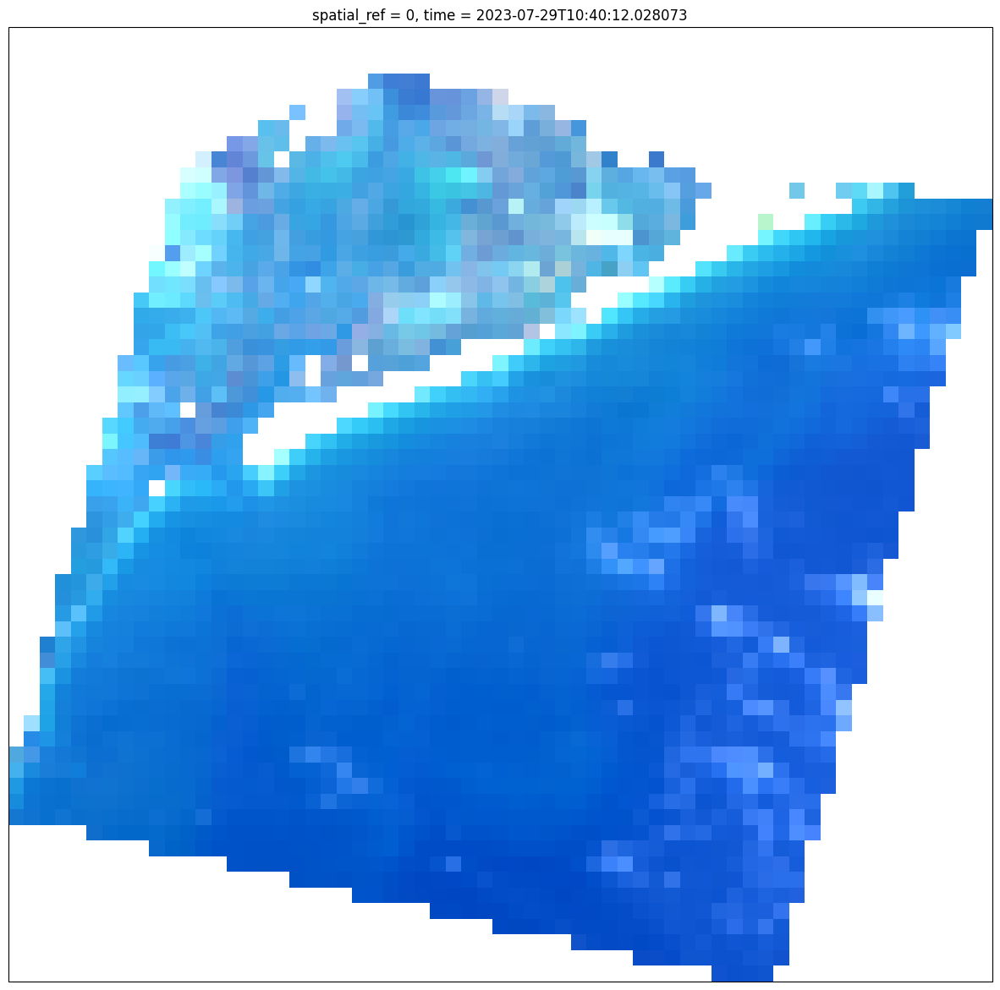

In [13]:
plt.figure(figsize=(15,15))
prod.coarse_masked_raster.Rtoa.sel(wl=[705,560,460],method='nearest').plot.imshow(rgb='wl',robust=True, subplot_kws=dict(projection= proj))

<Figure size 1500x1500 with 0 Axes>

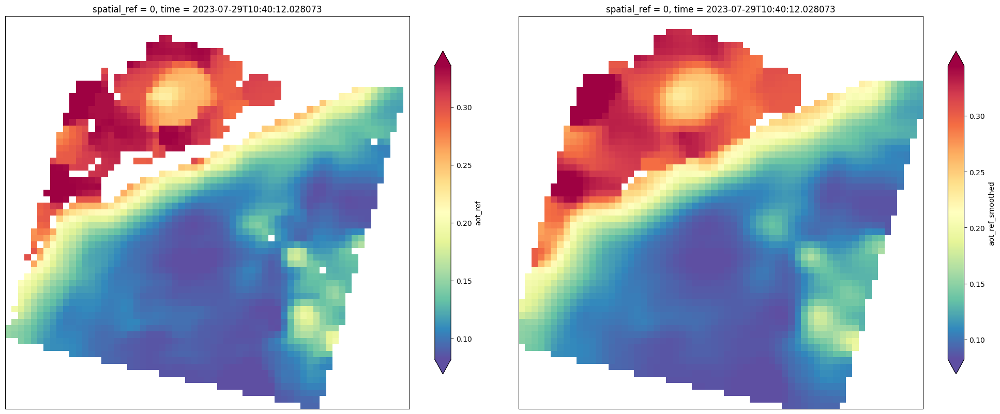

In [14]:
plt.figure(figsize=(15,15))

fig = plt.figure(figsize=(20,20), layout='tight')

ax = fig.add_subplot(221, projection=proj)
aero_retrieval.aero_img.aot_ref.plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)

ax = fig.add_subplot(222, projection=proj)
aero_retrieval.aero_img.aot_ref_smoothed.plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)

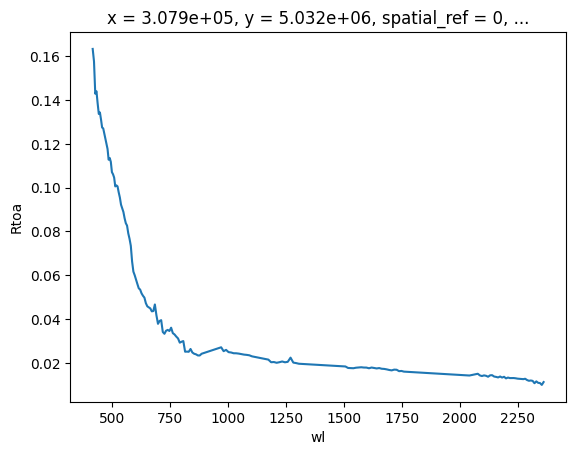

In [15]:
self.data.isel(x=30,y=31).dropna('wl').plot()

In [16]:
self.Rtoa_lut

<xarray.DataArray 'I' (aot_ref: 101, wl: 181)> Size: 146kB
array([[1.22685801e-01, 1.16025921e-01, 1.10079739e-01, ...,
        9.25779201e-05, 9.16934545e-05, 9.08633910e-05],
       [1.22823227e-01, 1.16163119e-01, 1.10216563e-01, ...,
        9.21097282e-05, 9.12621027e-05, 9.04719476e-05],
       [1.22832824e-01, 1.16172699e-01, 1.10226116e-01, ...,
        9.21235503e-05, 9.12778308e-05, 9.04897752e-05],
       ...,
       [2.11197301e-01, 2.04489327e-01, 1.98398857e-01, ...,
        2.82801212e-03, 2.80896932e-03, 2.79081013e-03],
       [2.16898379e-01, 2.10201333e-01, 2.04114565e-01, ...,
        3.02174859e-03, 3.00137591e-03, 2.98194387e-03],
       [2.22927575e-01, 2.16244796e-01, 2.10164444e-01, ...,
        3.22924285e-03, 3.20743413e-03, 3.18662713e-03]], shape=(101, 181))
Coordinates:
    wind         float64 8B 2.0
    model        <U9 36B 'WASO_rh0'
    vza          float64 8B 3.971
    azi          float64 8B 123.4
    sza          float64 8B 27.7
  * wl           (wl) float64 1kB 418.4 424.0 429.5 ... 2.438e+03 2.445e+03
    spatial_ref  int64 8B 0
    time         datetime64[ns] 8B 2023-07-29T10:40:12.028073
  * aot_ref      (aot_ref) float64 808B 0.0 0.001 0.00107 ... 0.6989 0.7478 0.8

In [17]:
prod.coarse_masked_raster.Rtoa.sel(wl=[470,550,670,865],method='nearest').drop_vars('tcwv')

<xarray.DataArray 'Rtoa' (wl: 4, y: 61, x: 63)> Size: 123kB
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], shape=(4, 61, 63))
Coordinates:
  * wl           (wl) float64 32B 468.4 550.7 673.1 863.7
  * x            (x) float64 504B 2.899e+05 2.905e+05 ... 3.265e+05 3.269e+05
  * y            (y) float64 488B 5.051e+06 5.05e+06 ... 5.015e+06 5.015e+06
    spatial_ref  int64 8B 0
    time         datetime64[ns] 8B 2023-07-29T10:40:12.028073
Attributes:
    water_vapor_correction:  True

In [19]:
import panel as pn

#hv.extension('bokeh')
pn.extension()
from grstbx import visual

self = aero_retrieval
v=visual.ViewSpectral(self.raster.Rtoa.sel(wl=[470,550,670,865],method='nearest').drop_vars('tcwv') ,reproject=True)
print(v)
v.minmax=[0,0.3]
v.minmaxvalues=(0,0.14)
v.visu()


Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Markdown(str)
                [1] RadioButtonGroup(options=[0, 1, 2, 3], value=2)
            [1] Row
                [0] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2023, ...], start=datetime.date(2023, ..., value=datetime.date(2023, ...)
                [1] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='CartoDark')
            [2] Row
                [0] Row
                    [0] Markdown(str)
                    [1] EditableRangeSlider(end=0.3, name='Range Slider', step=0.0001, value=(0, 0.14), width=300)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
        [2] HoloViews(Layout)

In [13]:
import geopandas as gpd

poi_stream = v.poi_stream
geom = poi_stream.data
geom=gpd.points_from_xy(geom['x'],geom['y'])#,crs="EPSG3857")index=[0], c
geom =gpd.GeoDataFrame(crs=3857, geometry=geom).to_crs(crs)
Ndata = len(geom)

indexes=np.dstack([geom.geometry.x,geom.geometry.y])[0]
xi,yi = indexes[-1]

In [14]:
indexes

array([[ 294707.16446019, 5013974.55142319]])

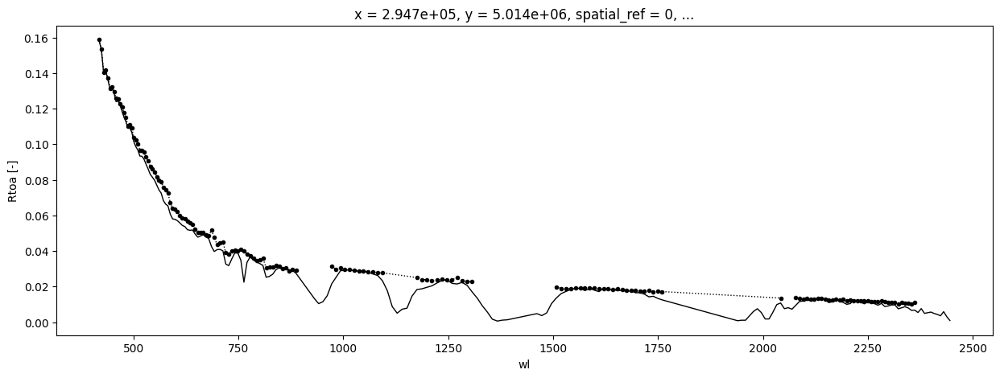

In [15]:
plt.figure(figsize=(15,5))
## AAOT
index = [ 309307.40200582, 5022570.30511158]
index = indexes[-1]
toa=self.raster.sel(x=index[0],y=index[1],method='nearest')
toa.Rtoa.plot(ls=':',marker='o',ms=3,color='k',lw=1)
l1c_prod.Rtoa.sel(x=index[0],y=index[1],method='nearest').plot(ls='-',color='k',lw=1)
#toa.plot.scatter(y='Rtoa',x='wl',hue='fwhm',marker='o',cmap=plt.cm.Spectral_r,zorder=6)

In [16]:
from scipy.optimize import least_squares, minimize, rosen, rosen_der

def func( x, aot, rot, Rtoa_lut, sunglint_eps, y):
    return (y - self.toa_simu(aot, rot, Rtoa_lut, sunglint_eps, *x) ) 

def cost_func( x, aot, rot, Rtoa_lut, sunglint_eps, y):
    return np.sum((self.func(x, aot, rot, Rtoa_lut, sunglint_eps, y)**2))

def constraint( x, aot, rot, Rtoa_lut, sunglint_eps, y):
    return np.min((func(x, aot, rot, Rtoa_lut, sunglint_eps, y)))
  

In [17]:

wl_atmo = [1000,1050,1075,1100,1200,1300,1600,1650,1700,2150,2200,2250]
wl_non_neg = [419.457,490,560,650,750,865,1650,2250]
x0=[0.1,0.003]


#y =self.data.sel(x=xi,y=yi).dropna('wl')# prod.coarse_masked_raster.Rtoa.isel(x=20,y=20).values
yfull = self.raster.Rtoa.sel(x=xi,y=yi,method='nearest').dropna('wl')

In [18]:
%%time
ls_res = least_squares(self.func, x0,
                        args=(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps, yfull.sel(wl=wl_atmo,method='nearest')),
                        bounds=([self.aod550_min, 0], [self.aod550_max, 1.3]),
                        diff_step=1e-3,
                        xtol=1e-3,
                        ftol=1e-4,
                        max_nfev=20)
ls_res

CPU times: user 250 ms, sys: 5.78 ms, total: 256 ms
Wall time: 253 ms


     message: `gtol` termination condition is satisfied.
     success: True
      status: 1
         fun: [-3.649e-04 -6.027e-04 -6.163e-04 -7.685e-04  8.969e-04
                2.823e-04  3.608e-04  1.564e-04  5.705e-04  4.147e-04
                3.864e-04  4.169e-05]
           x: [ 3.395e-01  1.195e-07]
        cost: 1.5770705017615258e-06
         jac: [[ 6.433e-02  8.789e-01]
               [ 6.311e-02  8.873e-01]
               ...
               [ 3.301e-02  1.001e+00]
               [ 3.149e-02  9.916e-01]]
        grad: [-5.351e-09  9.073e-04]
  optimality: 1.5531718867502293e-09
 active_mask: [ 0 -1]
        nfev: 7
        njev: 7

In [28]:
%%time
x0=[0.1,0.003]
cons = ({'type': 'ineq',
        'fun' : constraint,
        'args': (self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps, yfull.sel(wl=wl_non_neg,method='nearest'))
        }
       )
min_res= minimize(cost_func, x0,
                  args=(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps, yfull.sel(wl=wl_atmo,method='nearest')),
                  method='SLSQP',
                  bounds=((self.aod550_min, self.aod550_max),(0, None)),                                    
                  constraints=cons  ,options={'maxiter':10, 'disp':True }               
                                         )
min_res

Optimization terminated successfully    (Exit mode 0)
            Current function value: 5.1070626260440374e-05
            Iterations: 10
            Function evaluations: 33
            Gradient evaluations: 10
CPU times: user 923 ms, sys: 3.24 ms, total: 926 ms
Wall time: 923 ms


     message: Optimization terminated successfully
     success: True
      status: 0
         fun: 5.1070626260440374e-05
           x: [ 2.629e-01  2.444e-03]
         nit: 10
         jac: [-2.342e-03 -3.549e-02]
        nfev: 33
        njev: 10
 multipliers: [ 3.553e-02]

In [20]:
resVariance = res.fun
hess = np.array([min_res.jac]).T.dot(np.array([min_res.jac]))
hess_inv =np.linalg.inv(hess)

hess_inv#, resVariance


NameError: name 'res' is not defined

In [21]:
np.sum(min_res.jac**2)

np.float64(0.0012648164946299752)

In [22]:
J = min_res.jac[0]
np.linalg.inv(J.T.dot(J))

AttributeError: 'numpy.float64' object has no attribute 'dot'

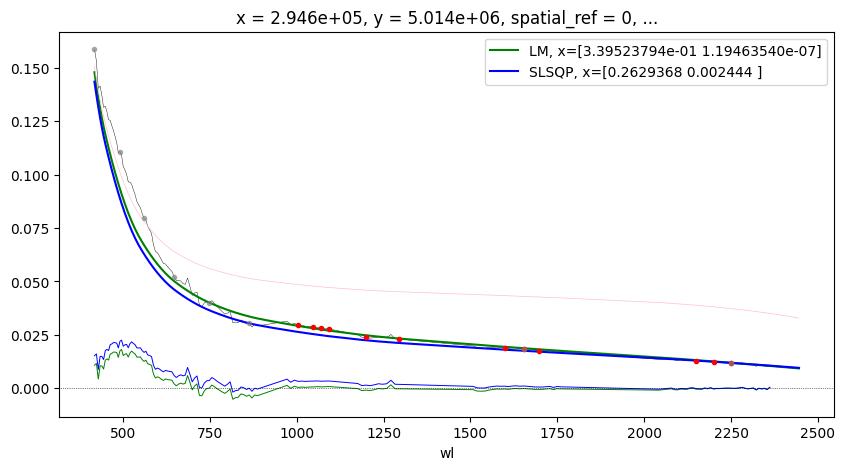

In [23]:
plt.figure(figsize=(10,5))

#self.data.sel(x=xi,y=yi).dropna('wl').plot(marker='o',lw=0.3,ms=2,color='k')
yfull.dropna('wl').plot(lw=0.3,color='k')

self.toa_simu(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps,*ls_res['x']).plot(color='g', label=f'LM, x={ls_res['x']}')
self.toa_simu(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps,*min_res['x']).plot(color='b', label=f'SLSQP, x={min_res['x']}')
self.toa_simu(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps,0.1,0.034).plot(color='pink',lw=0.5)
yfull.sel(wl=wl_atmo,method='nearest').plot(marker='o',lw=0,ms=3,color='r')
yfull.sel(wl=wl_non_neg,method='nearest').plot(marker='o',lw=0,ms=3,alpha=0.6,color='grey')

(yfull-self.toa_simu(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps,*ls_res['x'])).plot(color='g',lw=0.7)
(yfull-self.toa_simu(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps,*min_res['x'])).plot(color='b',lw=0.7)
#(yfull-self.toa_simu(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps,*min_res_['x'])).plot(color='r',lw=0.7)
plt.legend()
plt.axhline(0,color='k',ls=':',lw=0.5)

In [ ]:
### check other method sensitivity to first guess, speed of process...

In [211]:
%%time
wl_atmo_ = [1000,1050,1075,1100,1200,1300,1600,1650,1700]  
wl_non_neg = [419.457,490,560,650,750,865,1650]
cons = ({'type': 'ineq',
        'fun' : constraint,
        'args': (self.aot_lut.sel(wl=[*wl_non_neg,*wl_sunglint],method='nearest'), 
                 self.rot.sel(wl=[*wl_non_neg,*wl_sunglint],method='nearest'), 
                 self.Rtoa_lut.sel(wl=[*wl_non_neg,*wl_sunglint],method='nearest'), 
                 self.sunglint_eps.sel(wl=[*wl_non_neg,*wl_sunglint],method='nearest'), 
                 yfull.sel(wl=[*wl_non_neg,*wl_sunglint],method='nearest'))
        }
       )
min_res= minimize(cost_func, x0,
                  args=( aot_lut,rot, Rtoa_lut, sunglint,
                         yfull.sel(wl=[*wl_atmo_,*wl_sunglint],method='nearest')),
                  method='SLSQP',
                  bounds=((self.aod550_min, self.aod550_max),(0, 1.3)),                                           
                  constraints=cons  ,options={'maxiter':50}               
                                         )
min_res

CPU times: user 800 ms, sys: 6.39 ms, total: 806 ms
Wall time: 799 ms


     message: Optimization terminated successfully
     success: True
      status: 0
         fun: 3.5239857398886745e-05
           x: [ 1.399e-01  2.761e-03]
         nit: 8
         jac: [-1.053e-03 -3.800e-02]
        nfev: 32
        njev: 8
 multipliers: [ 3.772e-02]

In [27]:
%%time
min_res_= minimize(cost_func, x0,
                   args=(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps, yfull.sel(wl=wl_atmo,method='nearest')),
                   bounds=((self.aod550_min, self.aod550_max),(0, 1.3)),                                           
                   constraints=cons, method= 'COBYLA')#,options={'maxiter':50,'f_target':1e-6})
min_res_

CPU times: user 577 ms, sys: 10.6 ms, total: 587 ms
Wall time: 594 ms


 message: Return from COBYLA because the trust region radius reaches its lower bound.
 success: True
  status: 0
     fun: 0.004032731577698207
       x: [ 3.296e-01  2.841e-02]
    nfev: 21
   maxcv: 8.607697887796917e-15

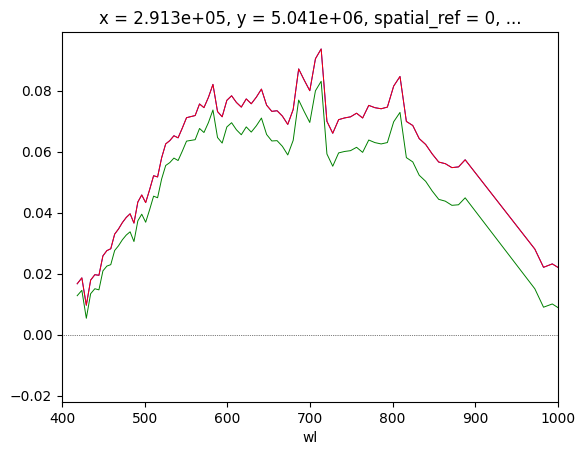

In [28]:
(yfull-self.toa_simu(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps,*ls_res['x'])).plot(color='g',lw=0.7)
(yfull-self.toa_simu(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps,*min_res['x'])).plot(color='b',lw=0.7)
(yfull-self.toa_simu(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps,*min_res_['x'])).plot(color='r',lw=0.7)

plt.xlim(400,1000)
plt.axhline(0,color='k',ls=':',lw=0.5)

In [18]:
self.raster

<xarray.Dataset> Size: 6MB
Dimensions:             (wl: 181, x: 63, y: 62)
Coordinates:
  * wl                  (wl) float64 1kB 418.4 424.0 ... 2.438e+03 2.445e+03
  * x                   (x) float64 504B 2.847e+05 2.853e+05 ... 3.219e+05
  * y                   (y) float64 496B 5.05e+06 5.05e+06 ... 5.014e+06
    spatial_ref         int64 8B 0
    time                datetime64[ns] 8B 2025-07-04T10:43:36.021070
    tcwv                (y, x) float64 31kB nan nan nan nan ... nan nan nan nan
Data variables:
    sza                 (y, x) float64 31kB dask.array<chunksize=(25, 25), meta=np.ndarray>
    vza                 (y, x) float64 31kB dask.array<chunksize=(25, 25), meta=np.ndarray>
    raa                 (y, x) float64 31kB dask.array<chunksize=(25, 25), meta=np.ndarray>
    air_mass            (y, x) float64 31kB dask.array<chunksize=(25, 25), meta=np.ndarray>
    Rtoa                (wl, y, x) float64 6MB nan nan nan nan ... nan nan nan
    water_pixel_number  (y, x) int64 31kB 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0
Attributes:
    description:        EnMAP L1C cube data
    L1C_product_name:   ENMAP01-____L1C-DT0000141797_20250704T104344Z_003_V01...
    acquisition_date:   2025-07-04 10:43:36.021070
    vnir_index:         [  0   1   2   3   4   5   6   7   8   9  10  11  12 ...
    swir_index:         [ 79  81  84  86  88  90  93  95  97  99 101 102 103 ...
    vnir_index_tokeep:  [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 1...
    swir_index_tokeep:  [ 86  88  90  93  95  97  99 101 102 103 104 105 106 ...
    vnir_bands:         [418.416 424.043 429.457 434.686 439.757 444.699 449....
    swir_bands:         [ 931.204  941.218  951.361  961.629  972.017  982.52...

In [28]:
self.first_guess

[array(0.23300785, dtype=float32), 0.0]

In [29]:


from multiprocessing import Pool  # Process pool
from multiprocessing import sharedctypes
import itertools
from scipy.optimize import least_squares
from numba import njit, prange

def solve(self, x0=[0.05, 0.001]):

    result = np.ctypeslib.as_ctypes(np.full((self.width, self.height, 4), np.nan))
    shared_array = sharedctypes.RawArray(result._type_, result)
    # TODO clean up method to assign first guess
    self.x0 = x0
    #self.x0 = self.first_guess

    data = self.raster.Rtoa
    height = self.height
    width = self.width
    print(height,width)
    if list(self.raster.keys()).__contains__('water_pixel_number'):
        water_pixel_number = self.raster.water_pixel_number
    else:
        water_pixel_number = None

    global chunk_process

    def chunk_process(args):
        window_x, window_y = args
        tmp = np.ctypeslib.as_array(shared_array)
        x0 = self.x0
        for ix in range(window_x, min(width, window_x + self.block_size)):
            for iy in range(window_y, min(height, window_y + self.block_size)):
                if water_pixel_number is not None:
                    if water_pixel_number.isel(x=ix, y=iy).values < self.pixel_threshold:
                        continue
                #x0 = self.x0
                yfull = data.isel(x=ix, y=iy).dropna(dim='wl')
                # sigma = Rtoa_std.isel(x=ix,y=iy).dropna(dim='wl')

                   
                cons = ({'type': 'ineq',
                        'fun' : constraint,
                        'args': (self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps, yfull.sel(wl=wl_non_neg,method='nearest'))
                        })
                
                min_res= minimize(cost_func, x0,
                                  args=(self.aot_lut, self.rot, self.Rtoa_lut, self.sunglint_eps, yfull.sel(wl=wl_atmo,method='nearest')),
                                  method='SLSQP',
                                  bounds=((self.aod550_min, self.aod550_max),(0, 1.3)),                                           
                                  constraints=cons  ,options={'maxiter':10}               
                                 )
                xres = min_res.x
                if min_res.success:
                    x0= xres
                # except:
                # print(wl_,aot_,rot_,Rtoa_lut_,sunglint_eps_, y)
                #    break
           
                std = [min_res.fun, np.sum(min_res.jac**2)]
                tmp[ix, iy, :] = [*xres, *std]

    window_idxs = [(i, j) for i, j in
                   itertools.product(range(0, self.width, self.block_size),
                                     range(0, self.height, self.block_size))]

    p = Pool()
    res = p.map(chunk_process, window_idxs)
    result = np.ctypeslib.as_array(shared_array)

    self.aero_img = xr.Dataset(dict(aot_ref=(["y", "x"], result[:, :, 0].T),
                                    brdfg=(["y", "x"], result[:, :, 1].T),
                                    aot_ref_std=(["y", "x"], result[:, :, 2].T),
                                    brdfg_std=(["y", "x"], result[:, :, 3].T)
                                    ),
                               coords=dict(
                                   x=self.x,
                                   y=self.y),
                               attrs=dict(
                                   description="aerosol and sunglint retrieval from coarse resolution data",
                                   aerosol_model=self.aerosol_model)
                               )


solve(self)
print('done !!!')

62 64
done !!!


In [21]:
aot_ref_median = aero_retrieval.aero_img.aot_ref_smoothed.median()
aero_retrieval.aero_img.aot_ref_smoothed.fillna(aot_ref_median)

<xarray.DataArray 'aot_ref_smoothed' (y: 61, x: 63)> Size: 31kB
array([[0.12747372, 0.12747372, 0.12747372, ..., 0.12747372, 0.12747372,
        0.12747372],
       [0.12747372, 0.12747372, 0.12747372, ..., 0.12747372, 0.12747372,
        0.12747372],
       [0.12747372, 0.12747372, 0.12747372, ..., 0.12747372, 0.12747372,
        0.12747372],
       ...,
       [0.12747372, 0.12747372, 0.12747372, ..., 0.12747372, 0.12747372,
        0.12747372],
       [0.12747372, 0.12747372, 0.12747372, ..., 0.12747372, 0.12747372,
        0.12747372],
       [0.12747372, 0.12747372, 0.12747372, ..., 0.12747372, 0.12747372,
        0.12747372]], shape=(61, 63))
Coordinates:
  * x            (x) float64 504B 2.899e+05 2.905e+05 ... 3.265e+05 3.269e+05
    spatial_ref  int64 8B 0
    time         datetime64[ns] 8B 2023-07-29T10:40:12.028073
  * y            (y) float64 488B 5.051e+06 5.05e+06 ... 5.015e+06 5.015e+06

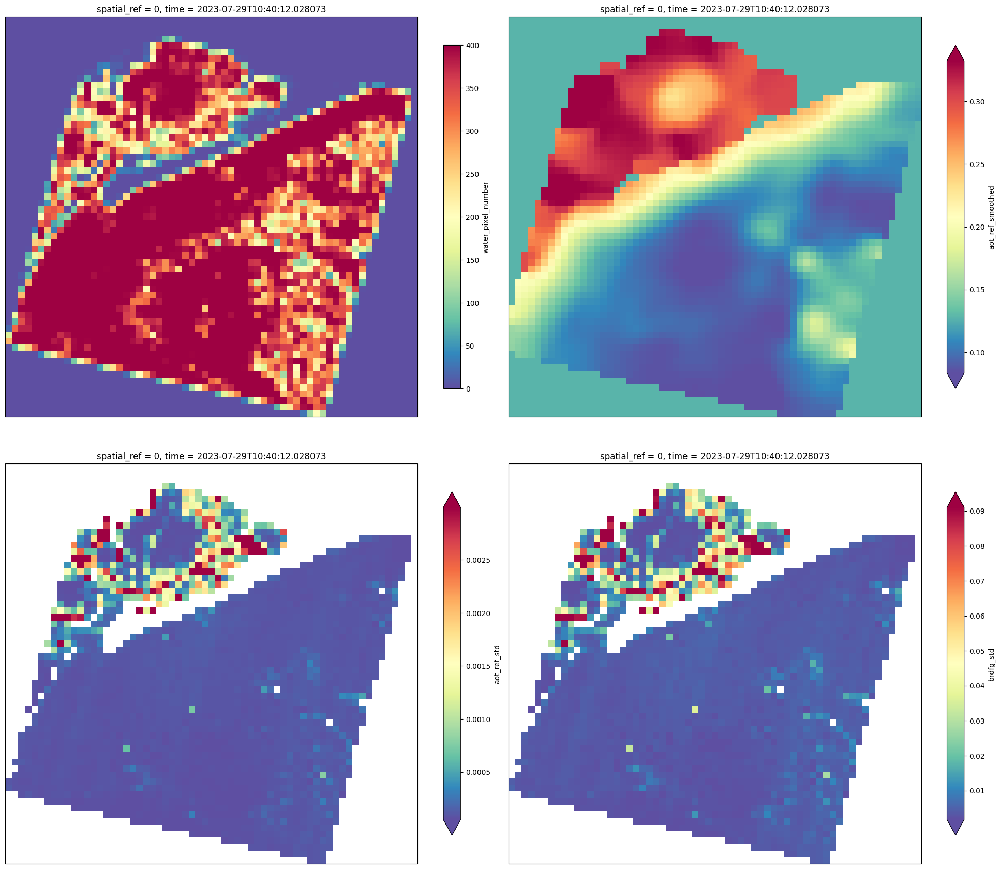

In [22]:

fig = plt.figure(figsize=(20,20), layout='tight')

ax = fig.add_subplot(221, projection=proj)
self.raster.water_pixel_number.plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)


ax = fig.add_subplot(222, projection=proj)
self.aero_img.aot_ref_smoothed.fillna(aot_ref_median).plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)



ax = fig.add_subplot(223, projection=proj)
self.aero_img.aot_ref_std.plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)


ax = fig.add_subplot(224, projection=proj)
self.aero_img.brdfg_std.plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)

In [31]:
np.nanmedian(self.aero_img.aot_ref_std)

np.float64(8.062649574810864e-05)

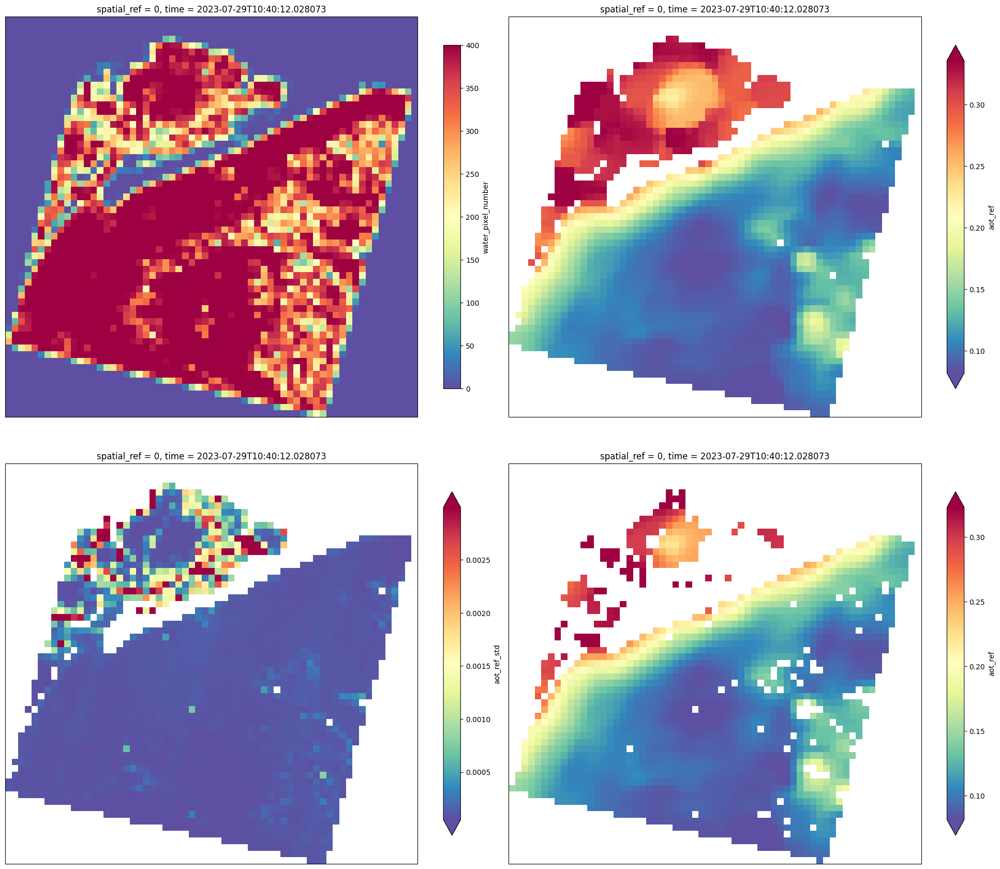

In [23]:

fig = plt.figure(figsize=(20,20), layout='tight')

ax = fig.add_subplot(221, projection=proj)
self.raster.water_pixel_number.plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)


ax = fig.add_subplot(222, projection=proj)
self.aero_img.aot_ref.plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)



ax = fig.add_subplot(223, projection=proj)
self.aero_img.aot_ref_std.plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)


ax = fig.add_subplot(224, projection=proj)
mask = (self.aero_img.aot_ref_std <  np.nanmean(self.aero_img.aot_ref_std)) & (self.raster.water_pixel_number > 200)

self.aero_img.aot_ref.where(mask).plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)

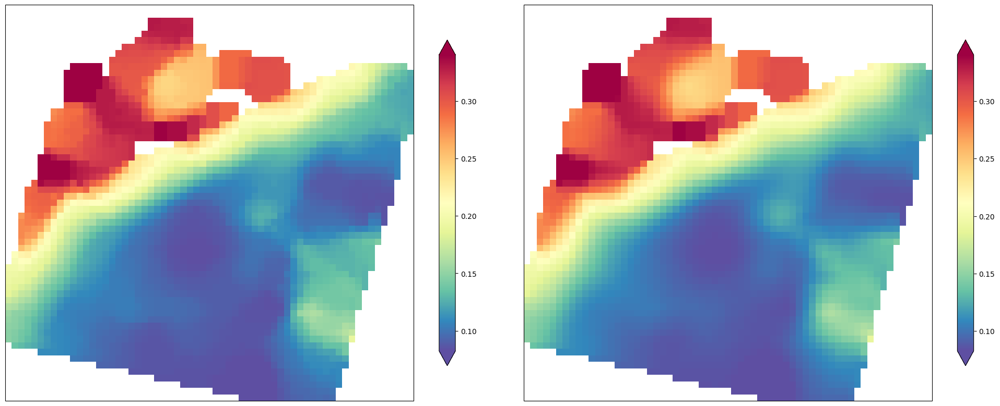

In [24]:
from scipy import ndimage

def conv_mapping(x):
    """
    Nan-mean convolution
    """
    # get index of central pixel
    idx = len(x) // 2
    if np.isnan(x[idx]) and not np.isnan(np.delete(x, idx)).all():
        return np.nanmean(np.delete(x, idx))
    elif np.isnan(np.delete(x, idx)).all():
        return x[idx]
    else:
        return np.nanmedian(x)


fig = plt.figure(figsize=(20,20), layout='tight')

ax = fig.add_subplot(221, projection=proj)
res = ndimage.generic_filter(self.aero_img.aot_ref.where(mask), function=conv_mapping, footprint=np.ones((5, 5)), mode='nearest')
xr.DataArray(res, coords=dict(y=self.aero_img.y, x=self.aero_img.x)).plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)
#l1c_prod.Rtoa.sel(wl=460,method='nearest').plot.imshow(cmap=plt.cm.Spectral_r, alpha=0.3,ax=ax)
ax = fig.add_subplot(222, projection=proj)
def conv_mapping( x):
    """
    Nan-mean convolution
    """
    # get index of central pixel
    idx = len(x) // 2
    if np.isnan(x[idx]) and not np.isnan(np.delete(x, idx)).all():
        return np.nanmean(np.delete(x, idx))
    elif np.isnan(np.delete(x, idx)).all():
        return x[idx]
    else:
        return np.nanmean(x)
res = ndimage.generic_filter(self.aero_img.aot_ref.where(mask), function=conv_mapping, footprint=np.ones((5, 5)), mode='nearest')
xr.DataArray(res, coords=dict(y=self.aero_img.y, x=self.aero_img.x)).plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)


In [25]:

from numba import njit
from scipy import ndimage


@njit
def filter2d(image, weight, windows):
    '''
     Function to convolve parameter image with uncertainty image
    :param image: parameter image
    :param weight: uncertainty image
    :param windows: size of the window for convolution
    :return: convolved result with same shape as image

    '''
    M, N = np.shape(image)
    Mf, Nf = windows
    Mf2 = Mf // 2
    Nf2 = Nf // 2
    threshold = 0
    result = np.full((M,N),np.nan)
    for i in range(M):
        for j in range(N):
            num = 0.0
            norm = 0.0
            if weight[i, j] > threshold:
                for ii in range(Mf):
                    ix = i - Mf2 + ii
                    if ix < M:
                        for jj in range(Nf):
                            iy = j - Nf2 + jj
                            if iy < N:
                                wgt = weight[ix, iy]
                                if wgt > 0.:
                                    num += (wgt * image[ix, iy])
                                    norm += wgt
                result[i, j] = num / norm
    return result


mask = (self.aero_img.aot_ref_std <  np.nanmean(self.aero_img.aot_ref_std)) & (self.raster.water_pixel_number > 350)
mask = (self.raster.water_pixel_number > 100)

param = self.aero_img.aot_ref.where(mask).__deepcopy__().to_numpy().astype(float)
weights = self.raster.water_pixel_number.__deepcopy__().to_numpy().astype(float)
weights = (1/self.aero_img.aot_ref_std**2).__deepcopy__().to_numpy().astype(float)

#weights=weights*0+1
windows=np.array([3, 3])
raster_smoothed = filter2d(param, weights, windows)

In [26]:
self.raster.water_pixel_number

<xarray.DataArray 'water_pixel_number' (y: 61, x: 63)> Size: 31kB
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], shape=(61, 63))
Coordinates:
  * x            (x) float64 504B 2.899e+05 2.905e+05 ... 3.265e+05 3.269e+05
  * y            (y) float64 488B 5.051e+06 5.05e+06 ... 5.015e+06 5.015e+06
    spatial_ref  int64 8B 0
    time         datetime64[ns] 8B 2023-07-29T10:40:12.028073
    tcwv         (y, x) float64 31kB nan nan nan nan nan ... nan nan nan nan nan

In [27]:
aero_retrieval.aero_img.aot_ref.mean()

<xarray.DataArray 'aot_ref' ()> Size: 8B
array(0.15999704)
Coordinates:
    spatial_ref  int64 8B 0
    time         datetime64[ns] 8B 2023-07-29T10:40:12.028073

In [28]:
mask = (self.raster.water_pixel_number > 200)
param = aero_retrieval.aero_img.aot_ref.where(mask).__deepcopy__().to_numpy().astype(float)

weights = (1/aero_retrieval.aero_img.aot_ref_std**2).__deepcopy__().to_numpy().astype(float)

In [29]:
raster_smoothed

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(61, 63))

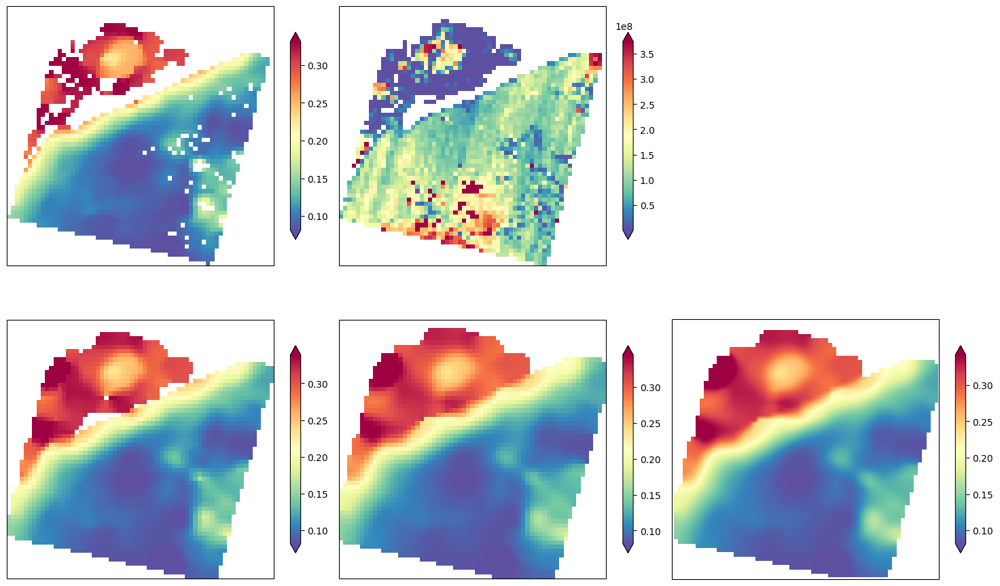

In [30]:

cmap = plt.cm.Spectral_r
fig = plt.figure(figsize=(15,10), layout='tight')

ax = fig.add_subplot(231, projection=proj)
xr.DataArray(param, coords=dict(y=self.aero_img.y, x=self.aero_img.x)).plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)

ax = fig.add_subplot(232, projection=proj)
xr.DataArray(weights, coords=dict(y=self.aero_img.y, x=self.aero_img.x)).plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)

#ax = fig.add_subplot(233, projection=proj)
#xr.DataArray(raster_smoothed, coords=dict(y=self.aero_img.y, x=self.aero_img.x)).plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)

ax = fig.add_subplot(234, projection=proj)
mask=np.ones((3, 3))
res = ndimage.generic_filter(param, function=conv_mapping, footprint=mask, mode='nearest')
xr.DataArray(res, coords=dict(y=self.aero_img.y, x=self.aero_img.x)).plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)


ax = fig.add_subplot(235, projection=proj)
mask=np.ones((3, 3))
res = ndimage.generic_filter(res, function=conv_mapping, footprint=mask, mode='nearest')
aot_550 = xr.DataArray(res, coords=dict(y=self.aero_img.y, x=self.aero_img.x))
aot_550.plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)


ax = fig.add_subplot(236, projection=proj)
aot_550_int=aot_550.interp(x=l1c_prod.x.values[::2],y=l1c_prod.y.values[::2])#,method='linear', kwargs={"fill_value": "extrapolate"})
aot_550_int.plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)

#
#mask=np.ones((10, 10))
#res = ndimage.generic_filter(aot_550_int, function=conv_mapping, footprint=mask, mode='nearest')
#aot_550 = xr.DataArray(res, coords=dict(y=aot_550_int.y, x=aot_550_int.x))
#aot_550.plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)


In [31]:
res

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(61, 63))

In [32]:
from scipy import ndimage

def conv_mapping( x):
    """
    Nan-mean convolution
    """
    # get index of central pixel
    idx = len(x) // 2
    if np.isnan(x[idx]) and not np.isnan(np.delete(x, idx)).all():
        return np.nanmean(np.delete(x, idx))
    elif np.isnan(np.delete(x, idx)).all():
        return x[idx]
    else:
        return np.nanmean(x)

def smoothing(self, windows=np.array([15, 15]), mask=np.ones((3, 3))):

    weights = self.raster['aot_ref_std'].values #(1 / self.aero_img['aot_ref_std'] ** 2).values
    param = self.aero_img['aot_ref'].fillna(0).__deepcopy__().values
    aot_ref_smoothed = self.filter2d(param, weights, windows)
    res = ndimage.generic_filter(aot_ref_smoothed, function=conv_mapping, footprint=mask, mode='nearest')

    self.aero_img['aot_ref_smoothed'] = xr.DataArray(res, coords=dict(y=self.aero_img.y, x=self.aero_img.x))

windows=np.array([15, 15])
mask=np.ones((3, 3))
smoothing(self)

KeyError: "No variable named 'aot_ref_std'. Variables on the dataset include ['wl', 'x', 'y', 'sza', 'vza', ..., 'Rtoa', 'spatial_ref', 'time', 'water_pixel_number', 'tcwv']"

In [ ]:
param = self.aero_img['aot_ref_'].fillna(0).__deepcopy__().values
plt.imshow(param)

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], shape=(61, 63))

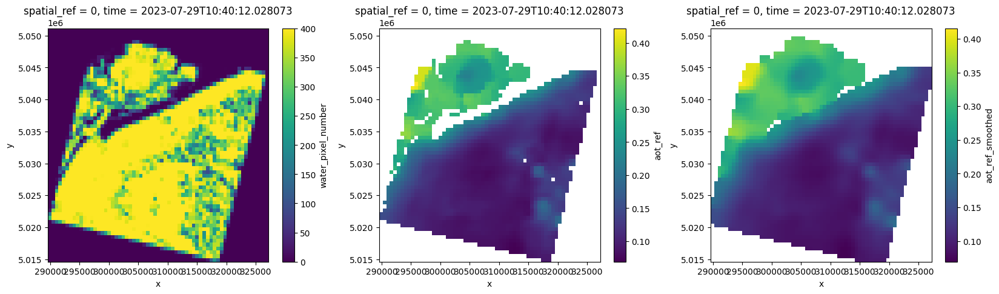

In [33]:
fig,axs = plt.subplots(1,3,figsize=(20,5))
axs=axs.ravel()
self.raster.water_pixel_number.plot.imshow(ax=axs[0])
self.aero_img.aot_ref.plot.imshow(ax=axs[1])
self.aero_img.aot_ref_smoothed.plot.imshow(ax=axs[2])
weights = self.raster.water_pixel_number.values #(1 / self.aero_img['aot_ref_std'] ** 2).values
param = self.aero_img['aot_ref'].values
self.filter2d(param, weights, windows)

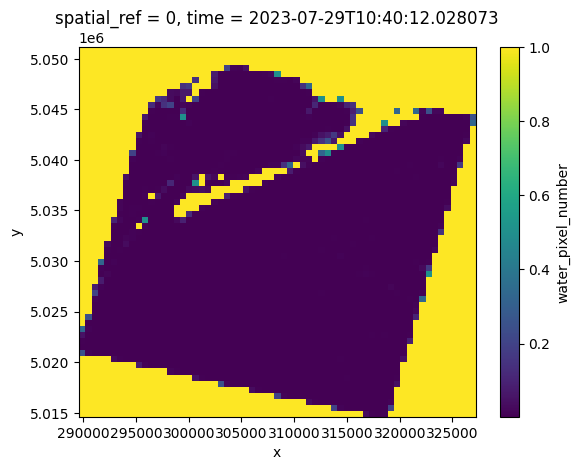

In [34]:
(1/(1+self.raster.water_pixel_number)).plot.imshow()

In [35]:
self.aero_img['aot_ref']=self.aero_img.brdfg

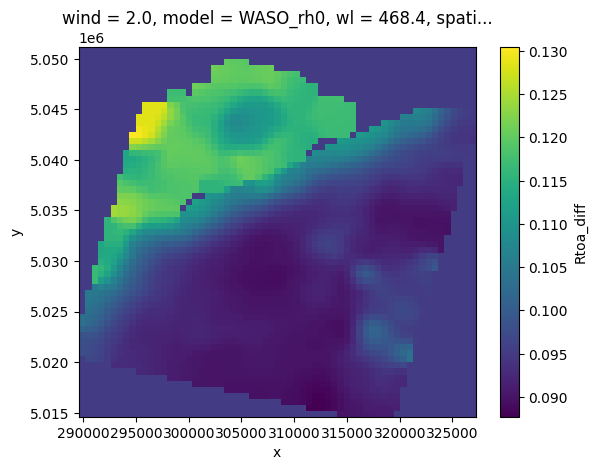

In [36]:

Rdiff_full = aero_retrieval.atmo_img.Rtoa_diff  # .interp(x=prod.raster.x, y=prod.raster.y)
Rdiff_full.isel(wl=10).plot.imshow()

In [37]:
# ------------------------------------------
# full resolution processing
# ------------------------------------------
logging.info('process full resolution')

prod.raster = prod.remove_wl_dataset(prod.raster, prod.wl_to_remove)
prod.other_gas_correction(raster_name='raster', variable='Rtoa')

# ------------------------------------------
# water vapor
# ------------------------------------------
chunk = 256
height, width, Nwl = len(prod.raster.y), len(prod.raster.x), len(prod.raster.wl)
results = np.full((height, width), 0, dtype=np.float32)
variable = 'Rtoa'
for iy in range(0, height, chunk):
    yc = min(height, iy + chunk)
    if yc > height:
        continue
    for ix in range(0, width, chunk):
        xc = min(width, ix + chunk)
        if xc > width:
            continue
        raster = prod.raster[variable][:, iy:yc, ix:xc]
        Twv_raster = prod.Twv_raster.interp(x=raster.x,y=raster.y)
        prod.raster[variable].data[:, iy:yc, ix:xc] = raster /  Twv_raster
       

Rdiff_full = aero_retrieval.atmo_img.Rtoa_diff  # .interp(x=prod.raster.x, y=prod.raster.y)
Tdir_full = aero_retrieval.atmo_img.Tdir  # .interp(x=prod.raster.x, y=prod.raster.y)
wl_sunglint = prod.wl_sunglint
    
Rrs = np.full((Nwl,height, width), np.nan, dtype=np.float32)
BRDF_sunglint = np.full((height, width), np.nan, dtype=np.float32)

for iy in range(0, height, chunk):
    yc = min(height, iy + chunk)
    if yc > height:
        continue
    for ix in range(0, width, chunk):
        xc = min(width, ix + chunk)
        if xc > width:
            continue
            
        Rcorr = prod.raster.Rtoa[:, iy:yc, ix:xc] 
        Rdiff_full_=Rdiff_full.interp(x=Rcorr.x, y=Rcorr.y)

        
        
        Rcorr = Rcorr - Rdiff_full_
        
        Tdir_full_=Tdir_full.interp(x=Rcorr.x, y=Rcorr.y)        

        sunglint_eps = aero_retrieval.sunglint_eps
        BRDF_sunglint[iy:yc, ix:xc]  = (Rcorr.sel(wl=wl_sunglint) / (Tdir_full_.sel(wl=wl_sunglint)
                                                      * sunglint_eps.sel(wl=wl_sunglint))).mean(dim='wl')
        
        # TODO clean up xarray inheritance of some extra coordinates...
        # BRDF_sunglint = BRDF_sunglint.drop_vars('aot_ref', errors=False).squeeze()
        Rdir = Tdir_full_ * sunglint_eps * BRDF_sunglint[iy:yc, ix:xc] 
        
        Rrs[:,iy:yc, ix:xc]  = (Rcorr - Rdir) / np.pi

l2_prod = xr.Dataset(dict(Rrs=(["wl", "y", "x"], Rrs),
                          brdfg_full=(["y", "x"], BRDF_sunglint), ),
                               coords=dict(x=prod.raster.x,
                                           y=prod.raster.y,
                                           wl=prod.raster.wl),
                               )
        

INFO:root:process full resolution


In [38]:
# finally correct for down and upward transmittances
# TODO compute pixel wise
Ttot_Ed = xr.open_dataset('/data/vrtc/xlut/transmittance_lut_opac_wind_v3.nc').isel(wind=1)
Ttot_Ed['wl'] = Ttot_Ed['wl'] * 1e3

aot_ref = float(aero_retrieval.aero_img.aot_ref.mean())
wl = l2_prod.Rrs.wl.values
sza = float(aero_retrieval.sza)
vza = float(aero_retrieval.vza)
Ttot_Ed_ = Ttot_Ed.Ttot_Ed.sel(model=opac_model).interp(sza=sza, method='cubic'
                                                        ).interp(aot_ref=aot_ref, method='quadratic').interp(
    wl=wl, method='cubic')
Ttot_Lu_ = Ttot_Ed.Ttot_Ed.sel(model=opac_model).interp(sza=vza, method='cubic'
                                                        ).interp(aot_ref=aot_ref, method='quadratic').interp(
    wl=wl, method='cubic') ** 1.05
Ttot = (Ttot_Ed_ * Ttot_Lu_).reset_coords(drop=True)
l2_prod['Rrs'] = l2_prod.Rrs / Ttot

In [39]:
l2_prod

<xarray.Dataset> Size: 2GB
Dimensions:      (wl: 181, y: 1216, x: 1248)
Coordinates:
  * x            (x) float64 10kB 2.896e+05 2.896e+05 ... 3.27e+05 3.27e+05
    spatial_ref  int64 8B 0
    time         datetime64[ns] 8B 2023-07-29T10:40:12.028073
  * y            (y) float64 10kB 5.051e+06 5.051e+06 ... 5.015e+06 5.015e+06
  * wl           (wl) float64 1kB 418.4 424.0 429.5 ... 2.438e+03 2.445e+03
Data variables:
    Rrs          (wl, y, x) float64 2GB nan nan nan nan nan ... nan nan nan nan
    brdfg_full   (y, x) float32 6MB nan nan nan nan nan ... nan nan nan nan nan

In [40]:
# -----------------------------
# construct output image
# -----------------------------
logging.info('construct final product')

# -----------------------------
# data
wv = wv_retrieval.water_vapor.rename({"x": "xc", "y": "yc"})
aero = aero_retrieval.aero_img.rename({"x": "xc", "y": "yc"})
water_pixel_prop = (prod.coarse_masked_raster.water_pixel_number / prod.Npix_per_megapix).drop_vars(
    'tcwv').rename({"x": "xc", "y": "yc"})
water_pixel_prop.name = 'water_pix_prop'
#geom = prod.raster[['lon', 'lat']].drop_vars('tcwv')
#Rrs_ = Rrs_l2.reset_coords().drop_vars(['model', 'z']).rename({'tcwv': 'tcwv_full', 'aot_ref': 'aot_ref_full'}).set_coords(['time','spatial_ref'])
l2_prod = xr.merge([l2_prod, wv, aero,water_pixel_prop])
#l2_prod['brdfg_full'] = BRDF_sunglint



param = 'Rrs'
l2_prod[param].attrs['unit'] = 'per steradian'
l2_prod[param].attrs['long_name'] = 'Remote sensing reflectance'
l2_prod[param].attrs['description'] = 'Directional water-leaving radiance normalized ' + \
                                      'by downwelling irradiance in the observation geometry'

param = 'water_pix_prop'
l2_prod[param].attrs['unit'] = '-'
l2_prod[param].attrs['description'] = 'Relative number of water pixel within mega-pixel used for inversion'

param = 'brdfg'
l2_prod[param].attrs['unit'] = '-'
l2_prod[param].attrs['long_name'] = 'BRDF_sunglint'
l2_prod[param].attrs['description'] = 'Bidirectional reflectance distribution function ' + \
                                      'estimated from the sunglint in the SWIR for the observation geometry'
param = 'brdfg_std'
l2_prod[param].attrs['unit'] = '-'
l2_prod[param].attrs['long_name'] = 'BRDF_sunglint_standard deviation'
l2_prod[param].attrs['description'] = 'Uncertainty based on optimal estimation procedure'
param = 'brdfg_full'
l2_prod[param].attrs['unit'] = '-'
l2_prod[param].attrs['long_name'] = 'BRDF_sunglint'
l2_prod[param].attrs['description'] = 'Bidirectional reflectance distribution function ' + \
                                      'estimated from the sunglint in the SWIR for the observation geometry'

param = 'aot_ref'
l2_prod[param].attrs['unit'] = '-'
l2_prod[param].attrs['long_name'] = 'aerosol_optical_thickness'
l2_prod[param].attrs['description'] = 'Aerosol optical thickness at the reference wavelength (550nm)'
param = 'aot_ref_std'
l2_prod[param].attrs['unit'] = '-'
l2_prod[param].attrs['long_name'] = 'aerosol_optical_thickness_standard_deviation'
l2_prod[param].attrs['description'] = 'Uncertainty based on optimal estimation procedure'
#param = 'aot_ref_full'
#l2_prod[param].attrs['unit'] = '-'
#l2_prod[param].attrs['long_name'] = 'aerosol_optical_thickness'
#l2_prod[param].attrs['description'] = 'Aerosol optical thickness at the reference wavelength (550nm)'

param = 'tcwv'
l2_prod[param].attrs['unit'] = 'kg m-2'
l2_prod[param].attrs['long_name'] = 'total_columnar_water_vapor'
l2_prod[param].attrs['description'] = 'Water vapor integrated over the atmospheric layer'
param = 'tcwv_std'
l2_prod[param].attrs['unit'] = 'kg m-2'
l2_prod[param].attrs['long_name'] = 'total_columnar_water_vapor_standard_deviation'
l2_prod[param].attrs['description'] = 'Uncertainty based on optimal estimation procedure'
#param = 'tcwv_full'
#l2_prod[param].attrs['unit'] = 'kg m-2'
#l2_prod[param].attrs['long_name'] = 'total_columnar_water_vapor'
#l2_prod[param].attrs['description'] = 'Water vapor integrated over the atmospheric layer'

l2_prod['pressure'] = prod.pressure
l2_prod['pressure'].attrs['unit'] = 'hPa'
l2_prod['pressure'].attrs['description'] = 'Atmospheric pressure at the surface level'
l2_prod['pressure'].attrs['source'] = 'computed from CAMS and DEM (see DEM metadata)'

param = 'to3c'
l2_prod[param] = prod.__dict__[param]
l2_prod[param].attrs['unit'] = ''
l2_prod[param].attrs['description'] = 'Total columnar ozone concentration'
l2_prod[param].attrs['source'] = 'CAMS'

param = 'tno2c'
l2_prod[param] = prod.__dict__[param]
l2_prod[param].attrs['unit'] = ''
l2_prod[param].attrs['description'] = 'Total columnar Nitrogen dioxide concentration'
l2_prod[param].attrs['source'] = 'CAMS'

# -----------------------------
# --metadata
l2_prod.attrs = prod.raster.attrs
l2_prod.attrs['processing_date'] = str(dt.datetime.now())
l2_prod.attrs['acquisition_date'] =str(l2_prod.attrs['acquisition_date'])
l2_prod.attrs['hgrs_version'] = hgrs.__version__
l2_prod.attrs['description'] = 'PRISMA L2A-hGRS cube data'
l2_prod.attrs['DEM'] = 'not available'
l2_prod.attrs['aerosol_model'] = aero_retrieval.aerosol_model
keys = ['wl_water_vapor', 'wl_sunglint', 'wl_atmo', 'wl_to_remove', 'wl_green', 'wl_nir', 'wl_1600', 'wl_rgb',
        'xcoarsen', 'ycoarsen', 'Npix_per_megapix', 'block_size', 'pixel_percentage', 'pixel_threshold',
        'ang_resol', 'abs_gas_file', 'lut_file', 'water_vapor_transmittance_file',
        'sunglint_threshold',
        'ndwi_threshold', 'green_swir_index_threshold', 'pressure', 'to3c', 'tno2c', 'tch4c', 'psl',
        'coef_abs_scat',
        'altitude']
for key in keys:
    print(key)
    l2_prod.attrs[key] = str(prod.__dict__[key])



def compute_scale_and_offset(array, nbit=16):
    max_, min_=np.nanmax(array),np.nanmin(array)
    # stretch/compress data to the available packed range
    scale_factor = (max_ - min_) / (2 ** nbit - 1)
    # translate the range to be symmetric about zero
    add_offset = min_ + 2 ** (nbit - 1) * scale_factor
    return scale_factor, add_offset

scale_factor, add_offset = compute_scale_and_offset(l2_prod.Rrs)
    

complevel = 5
encoding = {
            'Rrs': {'dtype': 'int16', 'scale_factor': scale_factor, 'add_offset': add_offset, '_FillValue': -32768, "zlib": True,
                    "complevel": complevel},
            #'aot_ref_full': {'dtype': 'int16', 'scale_factor': 0.001, '_FillValue': -9999, "zlib": True,
            #                 "complevel": complevel},
            'aot_ref': {'dtype': 'int16', 'scale_factor': 0.001, '_FillValue': -9999, "zlib": True,
                        "complevel": complevel},
            'aot_ref_std': {'dtype': 'int16', 'scale_factor': 0.001, '_FillValue': -9999, "zlib": True,
                            "complevel": complevel},
            'brdfg_full': {'dtype': 'int16', 'scale_factor': 0.00001, 'add_offset': .2, '_FillValue': -32768,
                           "zlib": True, "complevel": complevel},
            'brdfg': {'dtype': 'int16', 'scale_factor': 0.00001, 'add_offset': .2, '_FillValue': -32768, "zlib": True,
                      "complevel": complevel},
            'brdfg_std': {'dtype': 'int16', 'scale_factor': 0.00001, 'add_offset': .2, '_FillValue': -32768,
                          "zlib": True, "complevel": complevel},
            #'tcwv_full': {'dtype': 'int16', 'scale_factor': 0.01, '_FillValue': -9999, "zlib": True,
            #              "complevel": complevel},
            'tcwv': {'dtype': 'int16', 'scale_factor': 0.01, '_FillValue': -9999, "zlib": True, "complevel": complevel},
            'tcwv_std': {'dtype': 'int16', 'scale_factor': 0.01, '_FillValue': -9999, "zlib": True,
                         "complevel": complevel}}

l2_prod.to_netcdf(l2a_path,encoding=encoding) # 

INFO:root:construct final product


wl_water_vapor
wl_sunglint
wl_atmo
wl_to_remove
wl_green
wl_nir
wl_1600
wl_rgb
xcoarsen
ycoarsen
Npix_per_megapix
block_size
pixel_percentage
pixel_threshold
ang_resol
abs_gas_file
lut_file
water_vapor_transmittance_file
sunglint_threshold
ndwi_threshold
green_swir_index_threshold
pressure
to3c
tno2c
tch4c
psl
coef_abs_scat
altitude


In [41]:
#prod.aero_lut = aero_lut
l2_prod

<xarray.Dataset> Size: 2GB
Dimensions:           (wl: 181, y: 1216, x: 1248, yc: 61, xc: 63)
Coordinates:
  * x                 (x) float64 10kB 2.896e+05 2.896e+05 ... 3.27e+05 3.27e+05
    spatial_ref       int64 8B 0
    time              datetime64[ns] 8B 2023-07-29T10:40:12.028073
  * y                 (y) float64 10kB 5.051e+06 5.051e+06 ... 5.015e+06
  * wl                (wl) float64 1kB 418.4 424.0 429.5 ... 2.438e+03 2.445e+03
  * xc                (xc) float64 504B 2.899e+05 2.905e+05 ... 3.269e+05
  * yc                (yc) float64 488B 5.051e+06 5.05e+06 ... 5.015e+06
Data variables: (12/13)
    Rrs               (wl, y, x) float64 2GB nan nan nan nan ... nan nan nan nan
    brdfg_full        (y, x) float32 6MB nan nan nan nan nan ... nan nan nan nan
    tcwv              (yc, xc) float64 31kB nan nan nan nan ... nan nan nan nan
    tcwv_std          (yc, xc) float64 31kB nan nan nan nan ... nan nan nan nan
    aot_ref           (yc, xc) float64 31kB nan nan nan nan ... nan nan nan nan
    brdfg             (yc, xc) float64 31kB nan nan nan nan ... nan nan nan nan
    ...                ...
    brdfg_std         (yc, xc) float64 31kB nan nan nan nan ... nan nan nan nan
    aot_ref_smoothed  (yc, xc) float64 31kB nan nan nan nan ... nan nan nan nan
    water_pix_prop    (yc, xc) float64 31kB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    pressure          float64 8B 1.011e+03
    to3c              float64 8B 0.006772
    tno2c             float64 8B 4.149e-06
Attributes: (12/41)
    description:                     PRISMA L2A-hGRS cube data
    L1C_product_name:                ENMAP01-____L1C-DT0000029821_20230729T10...
    acquisition_date:                2023-07-29 10:40:12.028073
    vnir_index:                      [  0   1   2   3   4   5   6   7   8   9...
    swir_index:                      [ 79  81  84  86  88  90  93  95  97  99...
    vnir_index_tokeep:               [ 0  1  2  3  4  5  6  7  8  9 10 11 12 ...
    ...                              ...
    to3c:                            0.00677233973688751
    tno2c:                           4.148682107547733e-06
    tch4c:                           0.010258708901921307
    psl:                             1013
    coef_abs_scat:                   1.0
    altitude:                        0

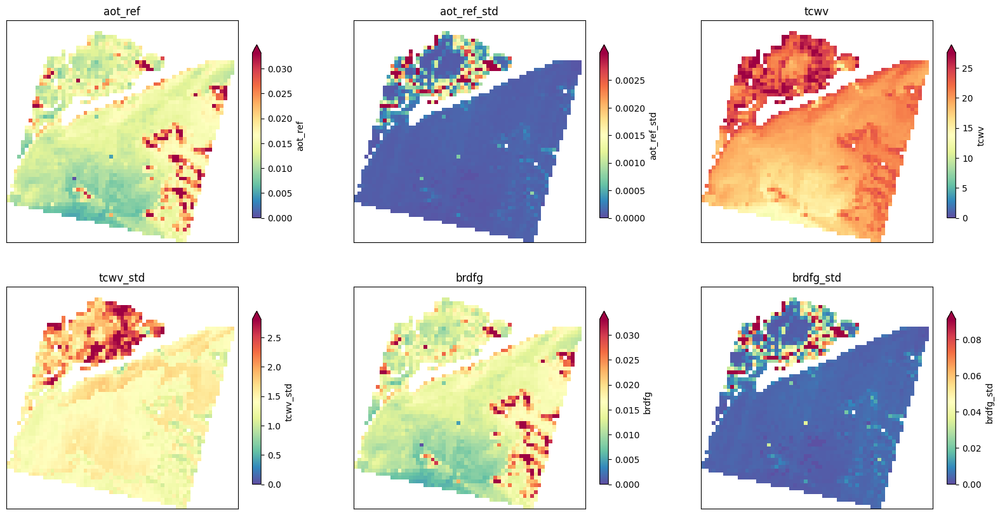

In [42]:
params=['aot_ref','aot_ref_std','tcwv','tcwv_std','brdfg','brdfg_std']

fig,axs = plt.subplots(2,3,figsize=(20,10))
axs=axs.ravel()

for i in range(len(params)):
    l2_prod[params[i]].plot.imshow(cmap=plt.cm.Spectral_r, robust=True,vmin=0,#vmax=0.201,
                               cbar_kwargs={'shrink': 0.78,'label':params[i]},ax=axs[i]) # extent=extent_val, transform=proj, 
    axs[i].set(xticks=[], yticks=[])
    axs[i].set_ylabel('')
    axs[i].set_xlabel('')    
    axs[i].set_title(params[i])    

In [43]:
l2_prod

<xarray.Dataset> Size: 2GB
Dimensions:           (wl: 181, y: 1216, x: 1248, yc: 61, xc: 63)
Coordinates:
  * x                 (x) float64 10kB 2.896e+05 2.896e+05 ... 3.27e+05 3.27e+05
    spatial_ref       int64 8B 0
    time              datetime64[ns] 8B 2023-07-29T10:40:12.028073
  * y                 (y) float64 10kB 5.051e+06 5.051e+06 ... 5.015e+06
  * wl                (wl) float64 1kB 418.4 424.0 429.5 ... 2.438e+03 2.445e+03
  * xc                (xc) float64 504B 2.899e+05 2.905e+05 ... 3.269e+05
  * yc                (yc) float64 488B 5.051e+06 5.05e+06 ... 5.015e+06
Data variables: (12/13)
    Rrs               (wl, y, x) float64 2GB nan nan nan nan ... nan nan nan nan
    brdfg_full        (y, x) float32 6MB nan nan nan nan nan ... nan nan nan nan
    tcwv              (yc, xc) float64 31kB nan nan nan nan ... nan nan nan nan
    tcwv_std          (yc, xc) float64 31kB nan nan nan nan ... nan nan nan nan
    aot_ref           (yc, xc) float64 31kB nan nan nan nan ... nan nan nan nan
    brdfg             (yc, xc) float64 31kB nan nan nan nan ... nan nan nan nan
    ...                ...
    brdfg_std         (yc, xc) float64 31kB nan nan nan nan ... nan nan nan nan
    aot_ref_smoothed  (yc, xc) float64 31kB nan nan nan nan ... nan nan nan nan
    water_pix_prop    (yc, xc) float64 31kB 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    pressure          float64 8B 1.011e+03
    to3c              float64 8B 0.006772
    tno2c             float64 8B 4.149e-06
Attributes: (12/41)
    description:                     PRISMA L2A-hGRS cube data
    L1C_product_name:                ENMAP01-____L1C-DT0000029821_20230729T10...
    acquisition_date:                2023-07-29 10:40:12.028073
    vnir_index:                      [  0   1   2   3   4   5   6   7   8   9...
    swir_index:                      [ 79  81  84  86  88  90  93  95  97  99...
    vnir_index_tokeep:               [ 0  1  2  3  4  5  6  7  8  9 10 11 12 ...
    ...                              ...
    to3c:                            0.00677233973688751
    tno2c:                           4.148682107547733e-06
    tch4c:                           0.010258708901921307
    psl:                             1013
    coef_abs_scat:                   1.0
    altitude:                        0

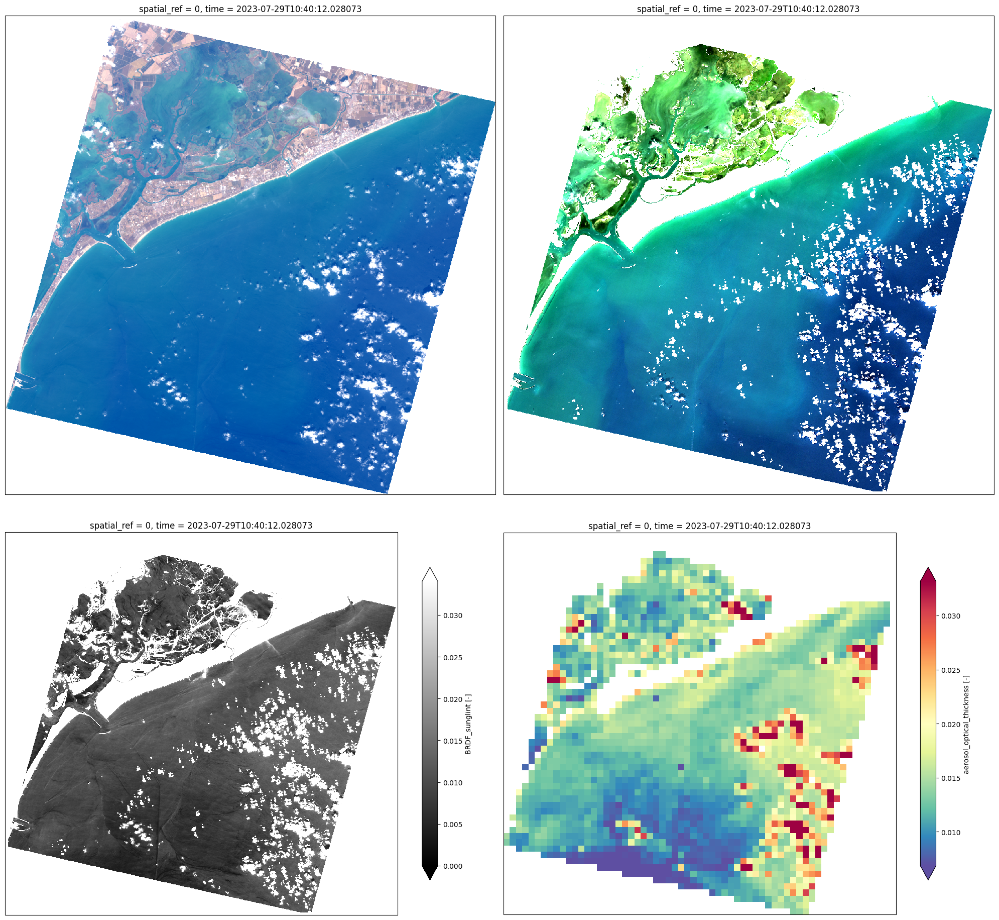

In [44]:
gamma=1#.5
str_epsg = str(l1c_prod.rio.crs)
crs = l1c_prod.rio.crs
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)

fig = plt.figure(figsize=(20,20), layout='tight')

ax = fig.add_subplot(221, projection=proj)
(l1c_prod.Rtoa.sel(wl=[705,560,460],method='nearest')**.2).plot.imshow(rgb='wl',robust=True, ax=ax)

ax = fig.add_subplot(222, projection=proj)
rgb=l2_prod.Rrs.sel(wl=[670,560,490],method='nearest')
adj = xr.DataArray([1,1,1],coords={"wl":rgb.wl})
((rgb*adj)**gamma).plot.imshow(rgb='wl',robust=True,ax=ax)

ax = fig.add_subplot(223, projection=proj)

l2_prod['brdfg_full'].plot.imshow(cmap=plt.cm.gray, robust=True,vmin=0, cbar_kwargs={'shrink': 0.6},ax=ax)#,add_colorbar=False)


ax = fig.add_subplot(224, projection=proj)

l2_prod['aot_ref'].plot.imshow(cmap=plt.cm.Spectral_r, robust=True, cbar_kwargs={'shrink': 0.6},ax=ax)

In [45]:
import panel as pn

#hv.extension('bokeh')
pn.extension()
from grstbx import visual

v=visual.ViewSpectral(l2_prod.Rrs.isel(wl=range(0,93,5)) ,reproject=True)
print(v)
v.minmax=[0,0.1]
v.minmaxvalues=(0,0.04)

In [46]:
v.visu()

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Markdown(str)
                [1] RadioButtonGroup(options=[0, 1, 2, 3, 4, ...], value=2)
            [1] Row
                [0] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2023, ...], start=datetime.date(2023, ..., value=datetime.date(2023, ...)
                [1] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='CartoDark')
            [2] Row
                [0] Row
                    [0] Markdown(str)
                    [1] EditableRangeSlider(end=0.1, name='Range Slider', step=0.0001, value=(0, 0.04), width=300)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
        [2] HoloViews(Layout)

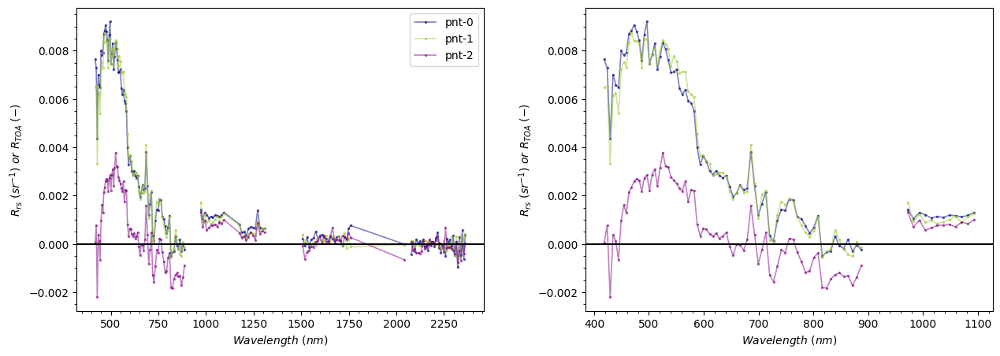

In [21]:
import geopandas as gpd

poi_stream = v.poi_stream
geom = poi_stream.data
geom=gpd.points_from_xy(geom['x'],geom['y'])#,crs="EPSG3857")index=[0], c
geom =gpd.GeoDataFrame(crs=3857, geometry=geom).to_crs(crs)
Ndata = len(geom)
cmap = mpl.colors.LinearSegmentedColormap.from_list("",
                                                    ['navy', "blue", 'lightskyblue',
                                                     "grey",   'forestgreen','yellowgreen',
                                                     "khaki", "gold",
                                                     'orangered', "firebrick", 'purple'])
norm = mpl.colors.Normalize(vmin=0.0,vmax=Ndata-1)


wl_range=slice(400,1100)
alpha=0.5
lw=1.2
ms=1.5

fig,axs = plt.subplots(1,2,figsize=(15,5))#,sharey=True)   
fig.subplots_adjust(hspace=0.05, wspace=0.25)
ax=axs[0]
indexes=np.dstack([geom.geometry.x,geom.geometry.y])[0]
for ii,index in enumerate(indexes):
    color=cmap(norm(ii))
   
   
    boa=l2_prod.Rrs.sel(x=index[0],y=index[1],method='nearest')
    
    boa.plot(label='pnt-'+str(ii),marker='o',ms=ms,lw=lw,c=color,alpha=alpha,ax=ax)
    
    boa.sel(wl=wl_range).plot(label='pnt-'+str(ii),marker='o',ms=ms,lw=lw,alpha=alpha,c=color,ax=axs[1])

    if False:
        toa=l1c_prod.Rtoa.sel(x=index[0],y=index[1],method='nearest')
        toa.plot(ms=ms,lw=lw,c=color,alpha=alpha,ax=ax)
        #toa.sel(wl=wl_range).plot(ms=ms,lw=lw,c=color,alpha=alpha,ax=axs[1])
#(0.04*prod.Tg_other).plot(marker='o',ms=2.5,lw=0.5,ax=axs[0])
#(0.04*prod.Tg_other).sel(wl=wl_range).plot(marker='o',color='k',ms=2.5,lw=0.5,ax=axs[1])
#(0.04*Twv).plot(marker='o',ms=2.5,lw=0.5,ax=axs[0])
#(0.04*Twv).sel(wl=wl_range).plot(marker='o',color='b',ms=2.5,lw=0.5,ax=axs[1])

for ax in  axs:
    ax.set_ylabel(r'$R_{rs}\ (sr^{-1})\ or\ R_{TOA}\ (-)$')
    ax.axhline(0,color='k')
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_title('')
    ax.minorticks_on() 
    #prod.Twv_raster.mean(['x','y']).plot(marker='o',ms=2.5,lw=0.5)
   

axs[0].legend(fontsize=10)

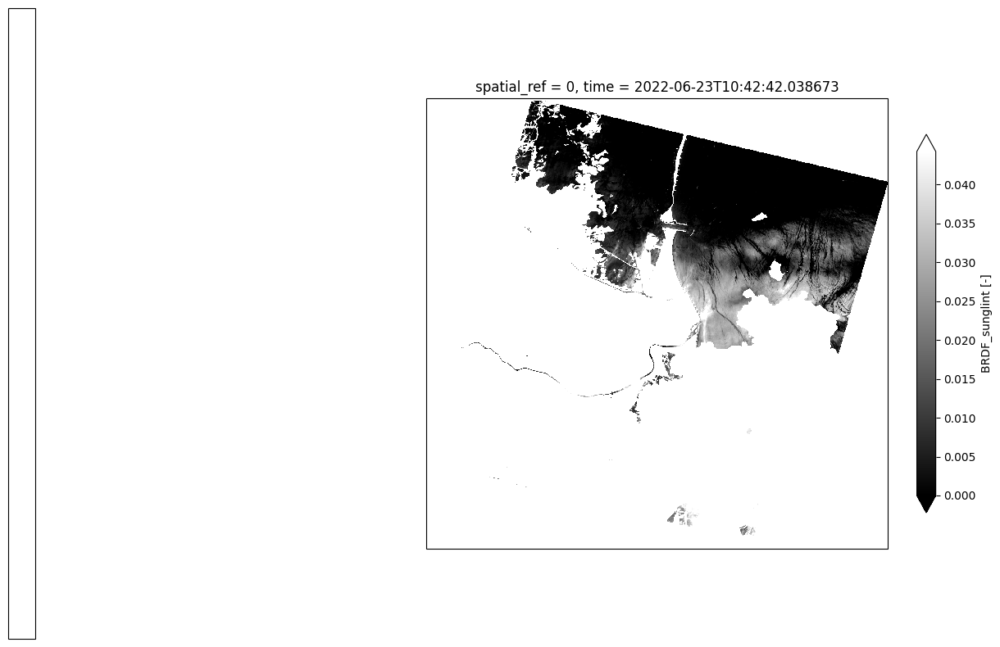

In [57]:


fig,axs = plt.subplots(1,2,figsize=(20,10),subplot_kw=dict(projection= proj))
axs=axs.ravel()

l2_prod.brdfg_full.plot.imshow(cmap=plt.cm.gray, robust=True,vmin=0,
                               cbar_kwargs={'shrink': 0.6},ax=axs[1]) # extent=extent_val, transform=proj, 
      
    

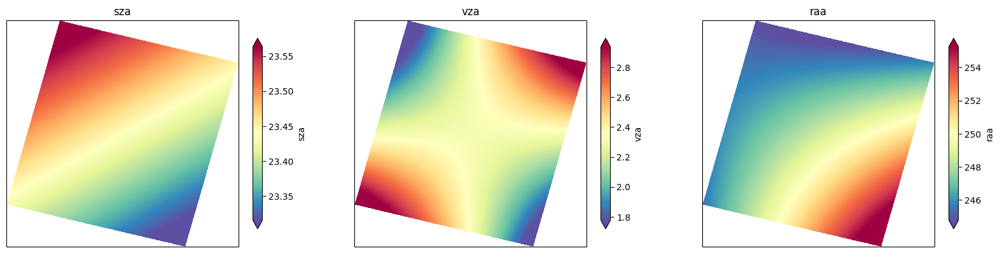

In [14]:
params=['sza','vza','raa']

fig,axs = plt.subplots(1,3,figsize=(20,5),subplot_kw=dict(projection= proj))
axs=axs.ravel()

for i in range(len(params)):
    l1c_prod[params[i]].plot.imshow(cmap=plt.cm.Spectral_r, robust=True,
                               cbar_kwargs={'shrink': 0.78,'label':params[i]},ax=axs[i]) # extent=extent_val, transform=proj, 
      
    axs[i].set_title(params[i])    

In [15]:
import logging

lut_file='/DATA/git/satellite_app/hgrs/data/lut/opac_osoaa_lut_v3_light.nc'
lut_file='/data/vrtc/xlut/toa_lut_opac_wind_up_v3.nc'

aero_lut = xr.open_dataset(lut_file).isel(wind=1).drop_sel(model='URBA_rh70').squeeze()
aero_lut['wl'] = aero_lut['wl'] * 1000

date = l1c_prod.time

# -----------------------------------------
# Create hGRS object
# -----------------------------------------
logging.info('Create hGRS object')
prod = hgrs.Algo(l1c_prod, expon=1.5, xcoarsen=20, ycoarsen=20)
prod.round_angles()

# -----------------------------------------
# get CAMS and set atmospheric parameters
# -----------------------------------------
logging.info('get CAMS and set atmospheric parameters')
# lazy loading
cams = xr.open_dataset(cams_path, decode_cf=True,
                       chunks={'time': 1, 'x': 500, 'y': 500})
# slicing
#
cams = cams.sel(latitude=clat, longitude=clon, method='nearest')
# fix for new ADS format (sept 2024)
if ('forecast_period' in cams.dims) & ('forecast_reference_time' in cams.dims):
    cams = cams.stack(time_buffer=['forecast_period', 'forecast_reference_time']).swap_dims(
        {'time_buffer': 'valid_time'}).sortby('valid_time').rename(
        {'valid_time': 'time'}).drop_vars(['time_buffer'])

cams = cams.sel(time=date, method='nearest')

# select OPAC aerosol model
# aod = cams[['aod355', 'aod380', 'aod400', 'aod440', 'aod469', 'aod500', 'aod550', 'aod645', 'aod670',
#            'aod800', 'aod865', 'aod1020', 'aod1064', 'aod1240', 'aod1640', 'aod2130']].to_pandas()
# aod.index = aod.index.str.replace('aod', '').astype(int)
# cams_aod = aod.to_xarray().rename({'index': 'wl'})
cams_wls = [469, 550, 670, 865, 1240]
param_aod = []
for wl in cams_wls:
    wl_ = str(wl)
    param_aod.append('aod' + wl_)

cams_aod = cams[param_aod].to_array(dim='wl')

wl_cams = cams_aod.wl.str.replace('aod', '').astype(float)
cams_aod = cams_aod.assign_coords(wl=wl_cams)

INFO:root:Create hGRS object
INFO:root:get CAMS and set atmospheric parameters
/tmp/ipykernel_25548/2034556663.py:23: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  cams = xr.open_dataset(cams_path, decode_cf=True,


In [9]:
rh = '_rh70'
models = ['COAV' + rh, 'COPO' + rh, 'DESE' + rh, 'MACL' + rh, 'MAPO' + rh,       ]  # 'ANTA' + rh, 'ARCT' + rh,'URBA' + rh
#lut_aod = aero_lut.aot.sel(model=models, aot_ref=1).interp(wl=cams_aod.wl)
#idx = np.abs((cams_aod / cams.aod550) - lut_aod).sum('wl').argmin()
#opac_model = aero_lut.sel(model=models).model.values[idx]

# new LUT:

lut_aod = aero_lut.aot.sel(aot_ref=1).interp(wl=cams_aod.wl)
idx = np.abs((cams_aod / cams.aod550) - lut_aod).sum('wl').argmin()
opac_model = aero_lut.model.values[idx]
print(opac_model)

# set gases and pressure
prod.pressure = float(cams.sp) * 1e-2
prod.to3c = float(cams.gtco3)
prod.tno2c = float(cams.tcno2)
prod.tch4c = float(cams.tc_ch4)

MACL_rh70


In [10]:
opac_model

'MACL_rh70'

In [11]:
# -----------------------------------------
# Apply water masking
# -----------------------------------------
logging.info('Apply water masking')
prod.apply_water_masks()

# -----------------------------------------
# Construct coarse resolution raster
# -----------------------------------------
logging.info('Construct coarse resolution raster')
prod.get_coarse_masked_raster()
# prod.plot_water_pix_number()

# -----------------------------------------
# Correct for gaseous absorption
# -----------------------------------------
logging.info('Correct for gaseous absorption')
prod.get_gaseous_transmittance()
prod.other_gas_correction()

INFO:root:Apply water masking
INFO:root:Construct coarse resolution raster
INFO:root:Correct for gaseous absorption


In [12]:
aero_lut

<xarray.Dataset> Size: 447MB
Dimensions:            (model: 5, aot_ref: 10, wl: 10, sza: 45, vza: 34, azi: 73)
Coordinates:
  * wl                 (wl) float32 40B 350.0 400.0 500.0 ... 2.2e+03 2.5e+03
  * aot_ref            (aot_ref) float32 40B 0.0 0.001 0.01 0.1 ... 0.7 1.0 1.5
  * sza                (sza) float32 180B 0.0 2.0 4.0 6.0 ... 84.0 86.0 88.0
    wind               float64 8B 2.0
  * vza                (vza) float32 136B 0.0 1.14 2.62 ... 45.93 47.43 48.92
  * azi                (azi) float32 292B 0.0 5.0 10.0 ... 350.0 355.0 360.0
  * model              (model) <U9 180B 'ARCT_rh70' 'COAV_rh70' ... 'WASO_rh0'
Data variables: (12/13)
    wl_ref             (model, aot_ref, wl) float32 2kB ...
    Cext_ref           (model, aot_ref, wl) float32 2kB ...
    ssa_ref            (model, aot_ref, wl) float32 2kB ...
    aot                (model, aot_ref, wl) float32 2kB ...
    Cext               (model, aot_ref, wl) float32 2kB ...
    ssa                (model, aot_ref, wl) float32 2kB ...
    ...                 ...
    bbp_ratio          (model, aot_ref, wl) float32 2kB ...
    bup_ratio          (model, aot_ref, wl) float32 2kB ...
    vol_mean_particle  (model, aot_ref, wl) float32 2kB ...
    nr                 (model, aot_ref, wl) float32 2kB ...
    Ed                 (model, aot_ref, wl, sza) float32 90kB ...
    I                  (model, aot_ref, wl, sza, vza, azi) float64 447MB ...

In [13]:
spectral = hgrs.Spectral(prod.wl,prod.fwhm,expon=1.83)
Tg_hyp = np.exp(- prod.air_mass_mean * prod.abs_gas_opt_thick)
Tg = spectral.convolve2(np.exp(- prod.air_mass_mean * prod.abs_gas_opt_thick),name='Tg')

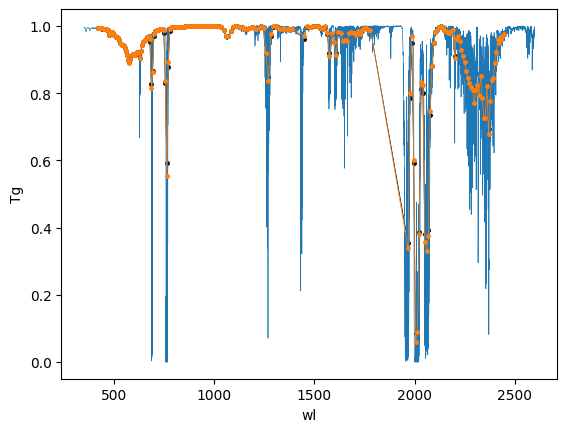

In [14]:
prod.Tg_other.plot(color='k',marker='o',ms=2.5,lw=0.5)
Tg_hyp.plot(lw=0.5)
Tg.plot(marker='o',ms=2.5,lw=0.5)

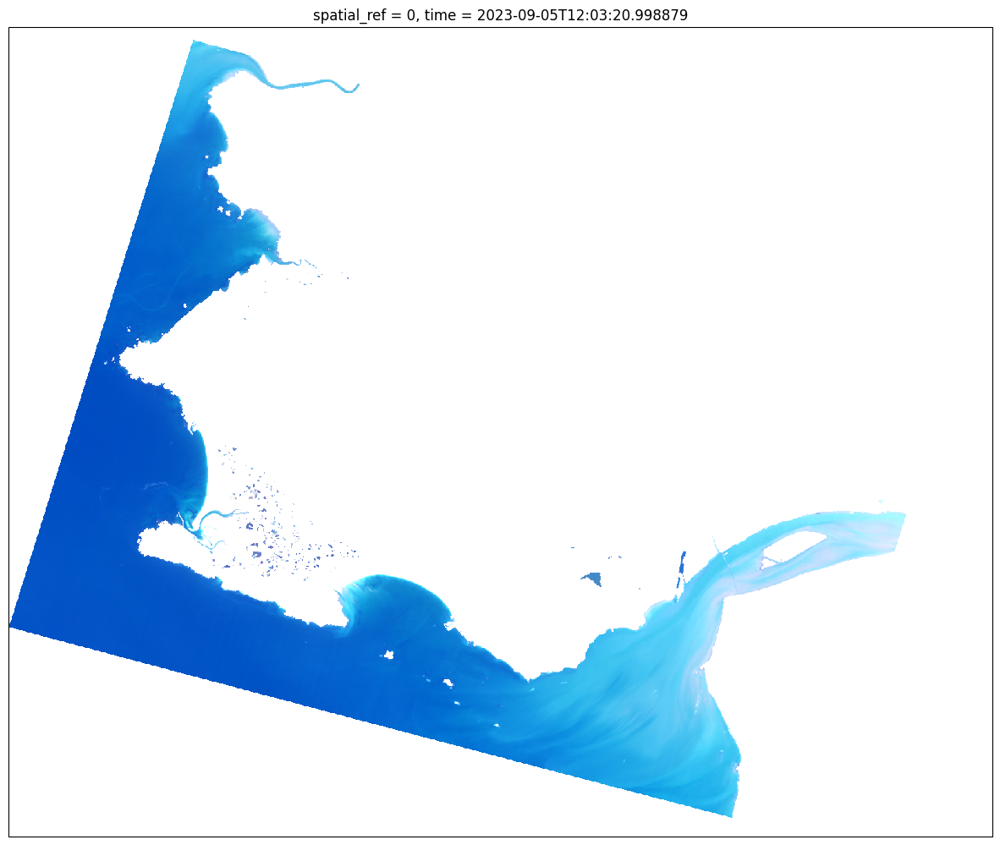

In [15]:
plt.figure(figsize=(15,15))
prod.raster.Rtoa[:, ::coarsening, ::coarsening].sel(wl=[705,560,460],method='nearest').plot.imshow(rgb='wl',robust=True, subplot_kws=dict(projection= proj))

In [16]:
logging.info('water vapor retrieval and correction')
wv_retrieval = hgrs.WaterVapor(prod)
wv_retrieval.solve()

INFO:root:water vapor retrieval and correction


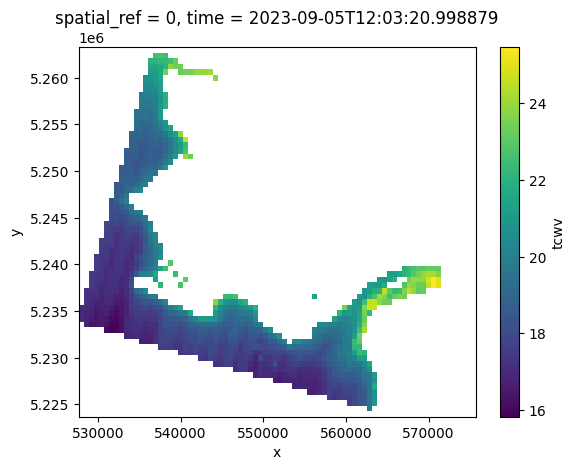

In [17]:
wv_retrieval.water_vapor.tcwv.plot.imshow()

In [18]:
prod.get_wv_transmittance_raster(wv_retrieval.water_vapor)
prod.water_vapor_correction()

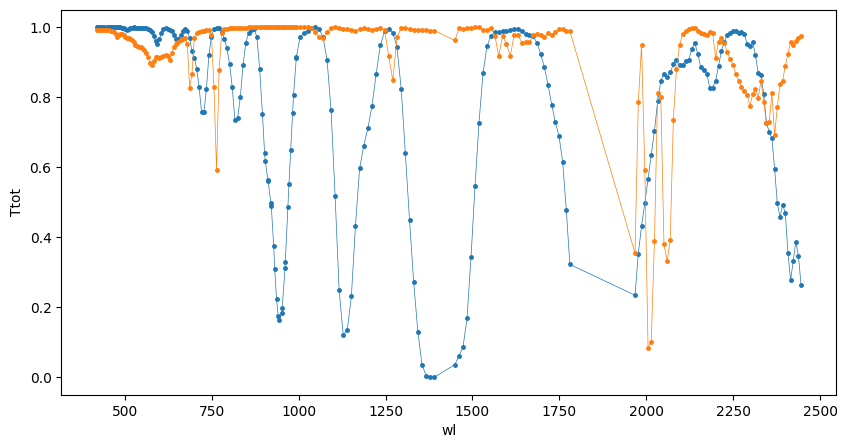

In [19]:
plt.figure(figsize=(10,5))
prod.Twv_raster.mean(['x','y']).plot(marker='o',ms=2.5,lw=0.5)
prod.Tg_other.plot(marker='o',ms=2.5,lw=0.5)

In [49]:
aot550_min

0.05579824885057788

In [ ]:
# ------------------------------------------
# aerosol retrieval
# ------------------------------------------
logging.info('aerosol retrieval')

variable = 'Rtoa'
prod.coarse_masked_raster = prod.remove_wl_dataset(
    prod.coarse_masked_raster, prod.wl_to_remove, variable=variable)

# TODO double check regularization from CAMS AOT values
aod550_mean = cams.aod550.mean().values

aod550_std = cams.aod550.std().values
aod550_std = np.max([aod550_std, 0.2 * aod550_mean+0.05])
aot550_min = 0.002# np.max([aod550_mean - 2*aod550_std,0.001])
aero_retrieval = hgrs.Aerosol(prod,
                              aerosol_model=opac_model,
                              first_guess=[aod550_mean, 0.],
                              aot550_limits=[aot550_min,
                                             aod550_mean + aod550_std])
aero_retrieval.solve()
self = aero_retrieval
self.prepare_lut(prod.coarse_masked_raster.wl)
self.smoothing()

#self.aero_img['aot_ref_smoothed']=self.aero_img['aot_ref_smoothed']*0.5
# construct aot raster
# with full res
#aot_ref_vals = self.aot_ref_full.round(3)
# with coarse res
aot_ref_vals = self.aero_img['aot_ref_smoothed'].round(3)
aot_refs = np.unique(aot_ref_vals)
aot_refs = aot_refs[~np.isnan(aot_refs)]
# TODO update LUT for aot< 0.001
aot_refs[aot_refs<0.002]=0.002
# if rounded aot_ref has unique value
if len(aot_refs) == 1:
    aot_refs = np.concatenate([ aot_refs, 1.2 * aot_refs])
aots = self.aot_lut.interp(aot_ref=aot_refs, method='linear')
aots = aots.interp(aot_ref=aot_ref_vals, method='nearest')

aots.name = 'aot'
aots.attrs['description'] = 'spectral aerosol optical thickness'

# construct raster for diffuse atmospheric reflectance
Rdiffs = self.Rtoa_lut.interp(aot_ref=aot_refs, method='linear')
Rdiffs = Rdiffs.interp(aot_ref=aot_ref_vals, method='nearest')
Rdiffs.name = 'Rtoa_diff'
Rdiffs.attrs['description'] = 'top-of-atmosphere atmosphere reflectance'



# construct raster for direct transmittance due to rayleigh and aerosol
Tdirs = self.transmittance_dir(aots, self.air_mass, rot=self.rot)
Tdirs.name = 'Tdir'
Tdirs.attrs['description'] = 'direct transmittance due to rayleigh and aerosol for total air mass'


aero_retrieval.get_atmo_parameters(prod.coarse_masked_raster.wl)

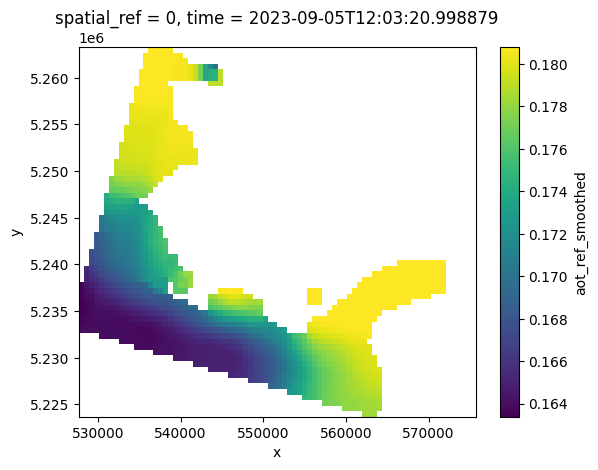

In [39]:
#self.aero_img['aot_ref_smoothed']=self.aero_img['aot_ref_smoothed']*0.5
self.aero_img.aot_ref_smoothed.plot.imshow()

In [33]:
# ------------------------------------------
# full resolution processing
# ------------------------------------------
logging.info('process full resolution')

prod.raster = prod.remove_wl_dataset(prod.raster, prod.wl_to_remove)
prod.other_gas_correction(raster_name='raster', variable='Rtoa')

INFO:root:process full resolution


raster raster.Rtoa is already corrected for other gases transmittance
set attribute other_gas_correction to False to proceed anyway


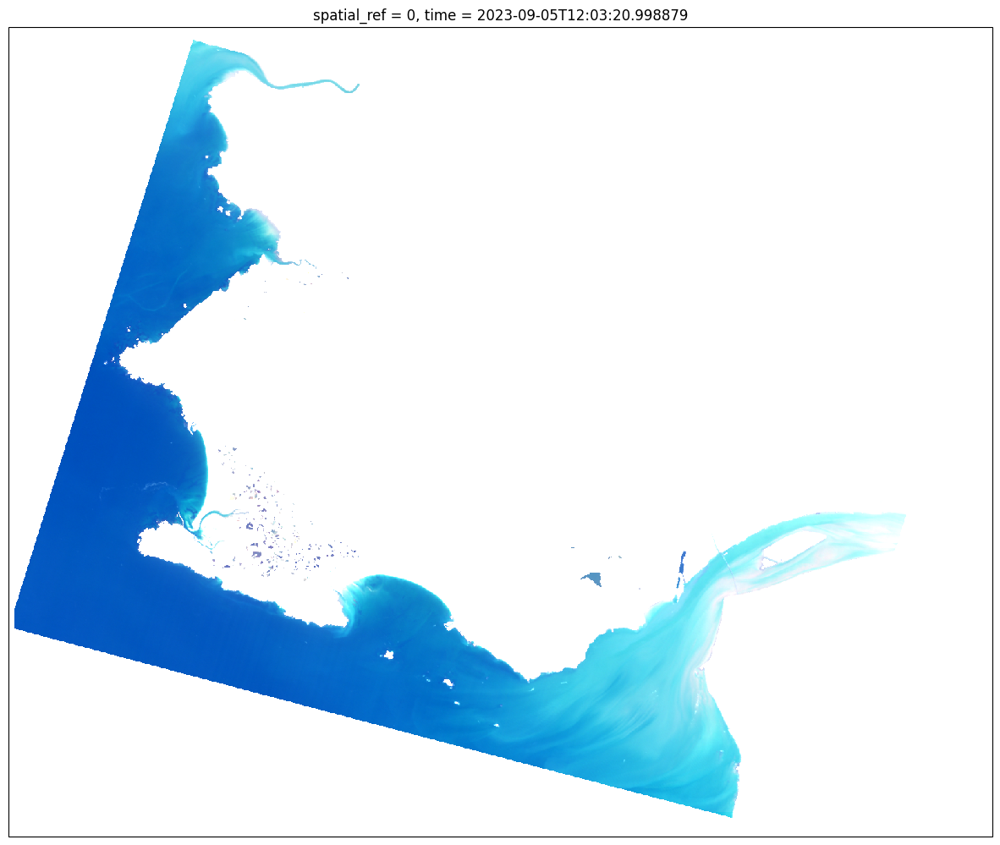

In [34]:
plt.figure(figsize=(15,15))
prod.raster.Rtoa[:, ::coarsening, ::coarsening].sel(wl=[705,560,460],method='nearest').plot.imshow(rgb='wl',robust=True, subplot_kws=dict(projection= proj))

In [35]:
#wv_full = prod.get_full_resolution(wv_retrieval.water_vapor)
#prod.get_wv_transmittance_raster(wv_retrieval.water_vapor)
#prod.water_vapor_correction(raster_name='raster', variable='Rtoa')

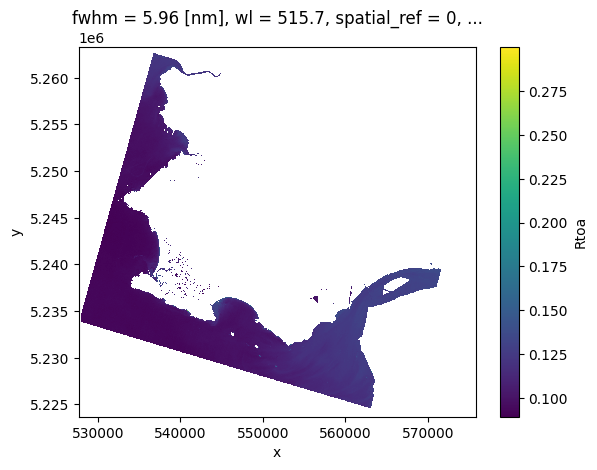

In [36]:
prod.raster.Rtoa.isel(wl=20).plot.imshow()

In [ ]:
# ------------------------------------------
# full resolution processing
# ------------------------------------------
chunk = 256
height, width, Nwl = len(prod.raster.y), len(prod.raster.x), len(prod.raster.wl)
results = np.full((height, width), 0, dtype=np.float32)
variable = 'Rtoa'
for iy in range(0, height, chunk):
    yc = min(height, iy + chunk)
    if yc == height:
        continue
    for ix in range(0, width, chunk):
        xc = min(width, ix + chunk)
        if xc == width:
            continue
        raster = prod.raster[variable][:, iy:yc, ix:xc]
        Twv_raster = prod.Twv_raster.interp(x=raster.x,y=raster.y)
        prod.raster[variable].data[:, iy:yc, ix:xc] = raster /  Twv_raster
       

Rdiff_full = aero_retrieval.atmo_img.Rtoa_diff  # .interp(x=prod.raster.x, y=prod.raster.y)
Tdir_full = aero_retrieval.atmo_img.Tdir  # .interp(x=prod.raster.x, y=prod.raster.y)
wl_sunglint = prod.wl_sunglint
    
Rrs = np.full((Nwl,height, width), np.nan, dtype=np.float32)
BRDF_sunglint = np.full((height, width), np.nan, dtype=np.float32)

for iy in range(0, height, chunk):
    yc = min(height, iy + chunk)
    if yc == height:
        continue
    for ix in range(0, width, chunk):
        xc = min(width, ix + chunk)
        if xc == width:
            continue
            
        Rcorr = prod.raster.Rtoa[:, iy:yc, ix:xc] 
        Rdiff_full_=Rdiff_full.interp(x=Rcorr.x, y=Rcorr.y)
        Rcorr = Rcorr - Rdiff_full_
        
        Tdir_full_=Tdir_full.interp(x=Rcorr.x, y=Rcorr.y)        

        sunglint_eps = aero_retrieval.sunglint_eps
        BRDF_sunglint[iy:yc, ix:xc]  = (Rcorr.sel(wl=wl_sunglint) / (Tdir_full_.sel(wl=wl_sunglint)
                                                      * sunglint_eps.sel(wl=wl_sunglint))).mean(dim='wl')
        
        # TODO clean up xarray inheritance of some extra coordinates...
        # BRDF_sunglint = BRDF_sunglint.drop_vars('aot_ref', errors=False).squeeze()
        Rdir = Tdir_full_ * sunglint_eps * BRDF_sunglint[iy:yc, ix:xc] 
        
        Rrs[:,iy:yc, ix:xc]  = (Rcorr - Rdir) / np.pi

l2_prod = xr.Dataset(dict(Rrs=(["wl", "y", "x"], Rrs),
                          brdfg_full=(["y", "x"], BRDF_sunglint), ),
                               coords=dict(x=prod.raster.x,
                                           y=prod.raster.y,
                                           wl=prod.raster.wl),
                               )


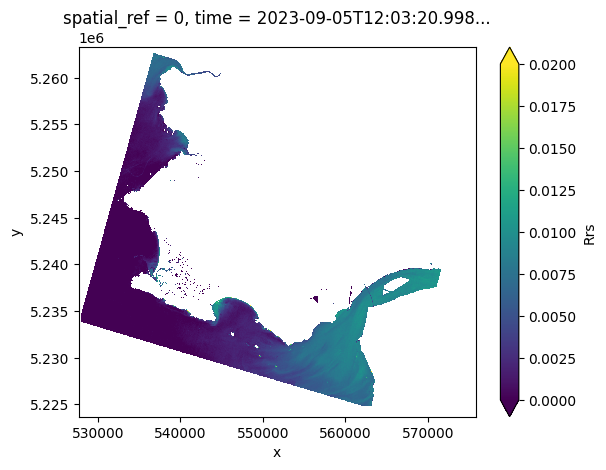

In [43]:
l2_prod.Rrs.isel(wl=20).plot.imshow(vmin=0,vmax=0.02)

In [ ]:
# finally correct for down and upward transmittances
# TODO compute pixel wise
Ttot_Ed = xr.open_dataset('/DATA/git/satellite_app/hgrs/data/lut/transmittance_downward_irradiance.nc')
aot_ref = float(aero_retrieval.aero_img.aot_ref.mean())
wl = l2_prod.Rrs.wl.values
sza = float(aero_retrieval.sza)
vza = float(aero_retrieval.vza)
Ttot_Ed_ = Ttot_Ed.Ttot_Ed.sel(model=opac_model).interp(sza=sza, method='cubic'
                                                        ).interp(aot_ref=aot_ref, method='quadratic').interp(
    wl=wl, method='cubic')
Ttot_Lu_ = Ttot_Ed.Ttot_Ed.sel(model=opac_model).interp(sza=vza, method='cubic'
                                                        ).interp(aot_ref=aot_ref, method='quadratic').interp(
    wl=wl, method='cubic') ** 1.05
Ttot = (Ttot_Ed_ * Ttot_Lu_).reset_coords(drop=True)
l2_prod['Rrs'] = l2_prod.Rrs / Ttot


# -----------------------------
# construct output image
# -----------------------------
logging.info('construct final product')

# -----------------------------
# data
wv = wv_retrieval.water_vapor.rename({"x": "xc", "y": "yc"})
aero = aero_retrieval.aero_img.rename({"x": "xc", "y": "yc"})
water_pixel_prop = (prod.coarse_masked_raster.water_pixel_number / prod.Npix_per_megapix).drop_vars(
    'tcwv').rename({"x": "xc", "y": "yc"})
water_pixel_prop.name = 'water_pix_prop'
#geom = prod.raster[['lon', 'lat']].drop_vars('tcwv')
#Rrs_ = Rrs_l2.reset_coords().drop_vars(['model', 'z']).rename({'tcwv': 'tcwv_full', 'aot_ref': 'aot_ref_full'}).set_coords(['time','spatial_ref'])
l2_prod = xr.merge([l2_prod, wv, aero,water_pixel_prop])
#l2_prod['brdfg_full'] = BRDF_sunglint



param = 'Rrs'
l2_prod[param].attrs['unit'] = 'per steradian'
l2_prod[param].attrs['long_name'] = 'Remote sensing reflectance'
l2_prod[param].attrs['description'] = 'Directional water-leaving radiance normalized ' + \
                                      'by downwelling irradiance in the observation geometry'

param = 'water_pix_prop'
l2_prod[param].attrs['unit'] = '-'
l2_prod[param].attrs['description'] = 'Relative number of water pixel within mega-pixel used for inversion'

param = 'brdfg'
l2_prod[param].attrs['unit'] = '-'
l2_prod[param].attrs['long_name'] = 'BRDF_sunglint'
l2_prod[param].attrs['description'] = 'Bidirectional reflectance distribution function ' + \
                                      'estimated from the sunglint in the SWIR for the observation geometry'
param = 'brdfg_std'
l2_prod[param].attrs['unit'] = '-'
l2_prod[param].attrs['long_name'] = 'BRDF_sunglint_standard deviation'
l2_prod[param].attrs['description'] = 'Uncertainty based on optimal estimation procedure'
param = 'brdfg_full'
l2_prod[param].attrs['unit'] = '-'
l2_prod[param].attrs['long_name'] = 'BRDF_sunglint'
l2_prod[param].attrs['description'] = 'Bidirectional reflectance distribution function ' + \
                                      'estimated from the sunglint in the SWIR for the observation geometry'

param = 'aot_ref'
l2_prod[param].attrs['unit'] = '-'
l2_prod[param].attrs['long_name'] = 'aerosol_optical_thickness'
l2_prod[param].attrs['description'] = 'Aerosol optical thickness at the reference wavelength (550nm)'
param = 'aot_ref_std'
l2_prod[param].attrs['unit'] = '-'
l2_prod[param].attrs['long_name'] = 'aerosol_optical_thickness_standard_deviation'
l2_prod[param].attrs['description'] = 'Uncertainty based on optimal estimation procedure'
#param = 'aot_ref_full'
#l2_prod[param].attrs['unit'] = '-'
#l2_prod[param].attrs['long_name'] = 'aerosol_optical_thickness'
#l2_prod[param].attrs['description'] = 'Aerosol optical thickness at the reference wavelength (550nm)'

param = 'tcwv'
l2_prod[param].attrs['unit'] = 'kg m-2'
l2_prod[param].attrs['long_name'] = 'total_columnar_water_vapor'
l2_prod[param].attrs['description'] = 'Water vapor integrated over the atmospheric layer'
param = 'tcwv_std'
l2_prod[param].attrs['unit'] = 'kg m-2'
l2_prod[param].attrs['long_name'] = 'total_columnar_water_vapor_standard_deviation'
l2_prod[param].attrs['description'] = 'Uncertainty based on optimal estimation procedure'
#param = 'tcwv_full'
#l2_prod[param].attrs['unit'] = 'kg m-2'
#l2_prod[param].attrs['long_name'] = 'total_columnar_water_vapor'
#l2_prod[param].attrs['description'] = 'Water vapor integrated over the atmospheric layer'

l2_prod['pressure'] = prod.pressure
l2_prod['pressure'].attrs['unit'] = 'hPa'
l2_prod['pressure'].attrs['description'] = 'Atmospheric pressure at the surface level'
l2_prod['pressure'].attrs['source'] = 'computed from CAMS and DEM (see DEM metadata)'

param = 'to3c'
l2_prod[param] = prod.__dict__[param]
l2_prod[param].attrs['unit'] = ''
l2_prod[param].attrs['description'] = 'Total columnar ozone concentration'
l2_prod[param].attrs['source'] = 'CAMS'

param = 'tno2c'
l2_prod[param] = prod.__dict__[param]
l2_prod[param].attrs['unit'] = ''
l2_prod[param].attrs['description'] = 'Total columnar Nitrogen dioxide concentration'
l2_prod[param].attrs['source'] = 'CAMS'

# -----------------------------
# --metadata
l2_prod.attrs = prod.raster.attrs
l2_prod.attrs['processing_date'] = str(dt.datetime.now())
l2_prod.attrs['acquisition_date'] =str(l2_prod.attrs['acquisition_date'])
l2_prod.attrs['hgrs_version'] = hgrs.__version__
l2_prod.attrs['description'] = 'PRISMA L2A-hGRS cube data'
l2_prod.attrs['DEM'] = 'not available'
l2_prod.attrs['aerosol_model'] = aero_retrieval.aerosol_model
keys = ['wl_water_vapor', 'wl_sunglint', 'wl_atmo', 'wl_to_remove', 'wl_green', 'wl_nir', 'wl_1600', 'wl_rgb',
        'xcoarsen', 'ycoarsen', 'Npix_per_megapix', 'block_size', 'pixel_percentage', 'pixel_threshold',
        'ang_resol', 'dirdata', 'abs_gas_file', 'lut_file', 'water_vapor_transmittance_file',
        'sunglint_threshold',
        'ndwi_threshold', 'green_swir_index_threshold', 'pressure', 'to3c', 'tno2c', 'tch4c', 'psl',
        'coef_abs_scat',
        'altitude']
for key in keys:
    l2_prod.attrs[key] = str(prod.__dict__[key])



def compute_scale_and_offset(array, nbit=16):
    max_, min_=np.nanmax(array),np.nanmin(array)
    # stretch/compress data to the available packed range
    scale_factor = (max_ - min_) / (2 ** nbit - 1)
    # translate the range to be symmetric about zero
    add_offset = min_ + 2 ** (nbit - 1) * scale_factor
    return scale_factor, add_offset

scale_factor, add_offset = compute_scale_and_offset(l2_prod.Rrs)

complevel = 5
encoding = {
            'Rrs': {'dtype': 'int16', 'scale_factor': scale_factor, 'add_offset': add_offset, '_FillValue': -32768, "zlib": True,
                    "complevel": complevel},
            'aot_ref_full': {'dtype': 'int16', 'scale_factor': 0.001, '_FillValue': -9999, "zlib": True,
                             "complevel": complevel},
            'aot_ref': {'dtype': 'int16', 'scale_factor': 0.001, '_FillValue': -9999, "zlib": True,
                        "complevel": complevel},
            'aot_ref_std': {'dtype': 'int16', 'scale_factor': 0.001, '_FillValue': -9999, "zlib": True,
                            "complevel": complevel},
            'brdfg_full': {'dtype': 'int16', 'scale_factor': 0.00001, 'add_offset': .2, '_FillValue': -32768,
                           "zlib": True, "complevel": complevel},
            'brdfg': {'dtype': 'int16', 'scale_factor': 0.00001, 'add_offset': .2, '_FillValue': -32768, "zlib": True,
                      "complevel": complevel},
            'brdfg_std': {'dtype': 'int16', 'scale_factor': 0.00001, 'add_offset': .2, '_FillValue': -32768,
                          "zlib": True, "complevel": complevel},
            'tcwv_full': {'dtype': 'int16', 'scale_factor': 0.01, '_FillValue': -9999, "zlib": True,
                          "complevel": complevel},
            'tcwv': {'dtype': 'int16', 'scale_factor': 0.01, '_FillValue': -9999, "zlib": True, "complevel": complevel},
            'tcwv_std': {'dtype': 'int16', 'scale_factor': 0.01, '_FillValue': -9999, "zlib": True,
                         "complevel": complevel}}

l2_prod.to_netcdf(l2a_path,encoding=encoding) # 

In [7]:
l2_prod = xr.open_dataset(l2a_path, decode_coords='all')
str_epsg = str(l2_prod.rio.crs)
crs = l2_prod.rio.crs
zone = str_epsg[-2:]
is_south = str_epsg[2] == 7
proj = ccrs.UTM(zone, is_south)

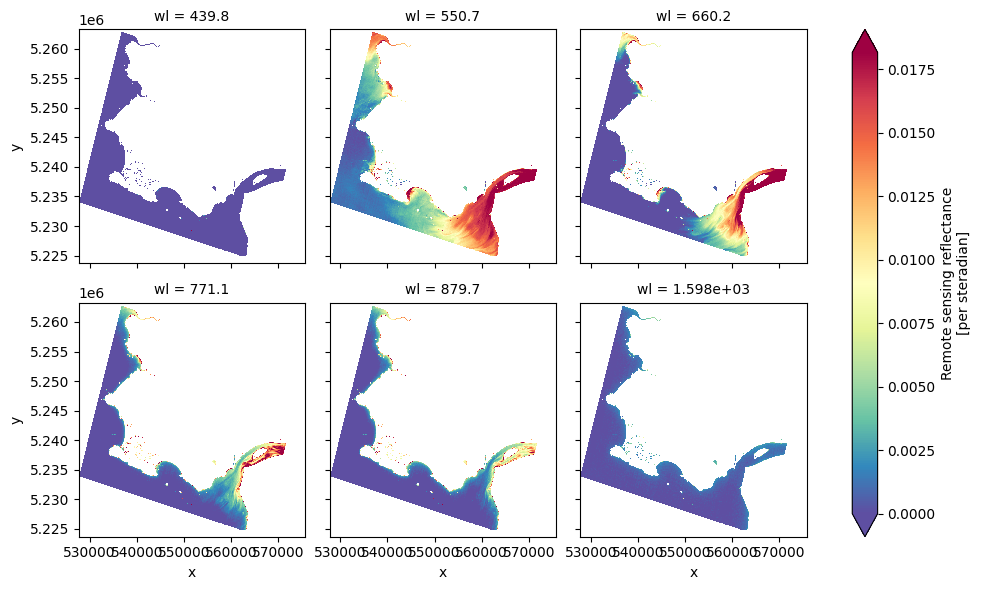

In [46]:
l2_prod.Rrs.sel(wl=[440,550,660,770,880,1600], method='nearest').plot.imshow(
    col='wl', col_wrap=3, cmap=plt.cm.Spectral_r,vmin=0, robust=True
)

In [47]:
import panel as pn

#hv.extension('bokeh')
pn.extension()
from grstbx import visual

v=visual.ViewSpectral(l2_prod.Rrs.isel(wl=range(0,93,5)) ,reproject=True)
print(v)
v.minmax=[0,0.1]
v.minmaxvalues=(0,0.04)
v.visu()

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Markdown(str)
                [1] RadioButtonGroup(options=[0, 1, 2, 3, 4, ...], value=2)
            [1] Row
                [0] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2023, ...], start=datetime.date(2023, 9, 5), value=datetime.date(2023, 9, 5))
                [1] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='CartoDark')
            [2] Row
                [0] Row
                    [0] Markdown(str)
                    [1] EditableRangeSlider(end=0.1, name='Range Slider', step=0.0001, value=(0, 0.04), width=300)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
        [2] HoloViews(Layout)

In [48]:
Twv =prod.Twv_raster.mean(['x','y']) #.plot(marker='o',ms=2.5,lw=0.5)

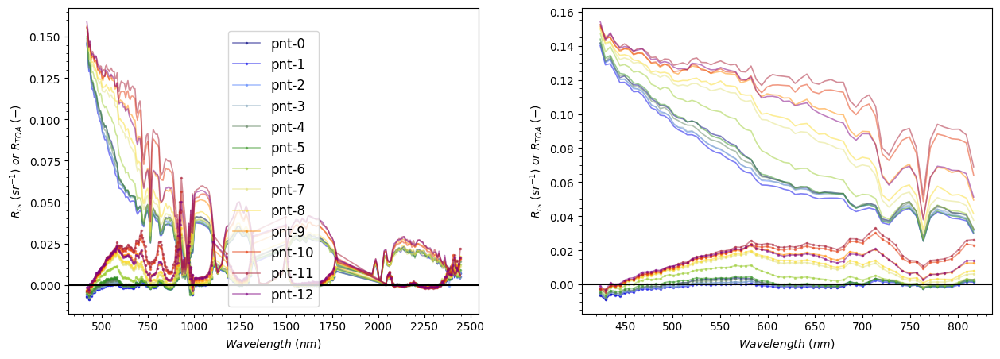

In [48]:
import geopandas as gpd

poi_stream = v.poi_stream
geom = poi_stream.data
geom=gpd.points_from_xy(geom['x'],geom['y'])#,crs="EPSG3857")index=[0], c
geom =gpd.GeoDataFrame(crs=3857, geometry=geom).to_crs(crs)
Ndata = len(geom)
cmap = mpl.colors.LinearSegmentedColormap.from_list("",
                                                    ['navy', "blue", 'lightskyblue',
                                                     "grey",   'forestgreen','yellowgreen',
                                                     "khaki", "gold",
                                                     'orangered', "firebrick", 'purple'])
norm = mpl.colors.Normalize(vmin=0.0,vmax=Ndata-1)


wl_range=slice(420,820)
alpha=0.5
lw=1.2
ms=1.5

fig,axs = plt.subplots(1,2,figsize=(15,5))#,sharey=True)   
fig.subplots_adjust(hspace=0.05, wspace=0.25)
ax=axs[0]
indexes=np.dstack([geom.geometry.x,geom.geometry.y])[0]
for ii,index in enumerate(indexes):
    color=cmap(norm(ii))
   
   
    boa=l2_prod.Rrs.sel(x=index[0],y=index[1],method='nearest')
    
    boa.plot(label='pnt-'+str(ii),marker='o',ms=ms,lw=lw,c=color,alpha=alpha,ax=ax)
    
    boa.sel(wl=wl_range).plot(label='pnt-'+str(ii),marker='o',ms=ms,lw=lw,alpha=alpha,c=color,ax=axs[1])

    if True:
        toa=l1c_prod.Rtoa.sel(x=index[0],y=index[1],method='nearest')
        toa.plot(ms=ms,lw=lw,c=color,alpha=alpha,ax=ax)
        toa.sel(wl=wl_range).plot(ms=ms,lw=lw,c=color,alpha=alpha,ax=axs[1])
#(0.04*prod.Tg_other).plot(marker='o',ms=2.5,lw=0.5,ax=axs[0])
#(0.04*prod.Tg_other).sel(wl=wl_range).plot(marker='o',color='k',ms=2.5,lw=0.5,ax=axs[1])
#(0.04*Twv).plot(marker='o',ms=2.5,lw=0.5,ax=axs[0])
#(0.04*Twv).sel(wl=wl_range).plot(marker='o',color='b',ms=2.5,lw=0.5,ax=axs[1])

for ax in  axs:
    ax.set_ylabel(r'$R_{rs}\ (sr^{-1})\ or\ R_{TOA}\ (-)$')
    ax.axhline(0,color='k')
    ax.set_xlabel(r'$Wavelength\ (nm)$')
    ax.set_title('')
    ax.minorticks_on() 
    #prod.Twv_raster.mean(['x','y']).plot(marker='o',ms=2.5,lw=0.5)
   

axs[0].legend(fontsize=12)

In [11]:
l2_prod

<xarray.Dataset> Size: 3GB
Dimensions:           (wl: 192, x: 1434, y: 1171, yc: 58, xc: 71)
Coordinates:
  * wl                (wl) float64 2kB 418.4 424.0 429.5 ... 2.438e+03 2.445e+03
  * x                 (x) float64 11kB 6.314e+05 6.315e+05 ... 6.744e+05
  * y                 (y) float64 9kB 5.063e+06 5.063e+06 ... 5.028e+06
    spatial_ref       int64 8B 0
    time              datetime64[ns] 8B 2023-06-22T11:20:31.022526
  * xc                (xc) float64 568B 6.317e+05 6.323e+05 ... 6.737e+05
  * yc                (yc) float64 464B 5.063e+06 5.062e+06 ... 5.028e+06
Data variables: (12/19)
    fwhm              (wl) float64 2kB ...
    tcwv_full         (y, x) float64 13MB ...
    aot_ref_full      (y, x) float64 13MB ...
    vza               float64 8B ...
    azi               float64 8B ...
    sza               float64 8B ...
    ...                ...
    aot_ref_smoothed  (yc, xc) float64 33kB ...
    water_pix_prop    (yc, xc) float64 33kB ...
    brdfg_full        (y, x) float64 13MB ...
    pressure          float64 8B ...
    to3c              float64 8B ...
    tno2c             float64 8B ...
Attributes: (12/36)
    description:                     PRISMA L2A-hGRS cube data
    L1C_product_name:                ENMAP01-____L1C-DT0000023369_20230622T11...
    acquisition_date:                2023-06-22 11:20:31.022526
    processing_date:                 2025-07-10 15:04:12.612857
    hgrs_version:                    1.0.6
    DEM:                             not available
    ...                              ...
    to3c:                            0.007178874351366757
    tno2c:                           1.8731939211978936e-06
    tch4c:                           0.01030874088648272
    psl:                             1013
    coef_abs_scat:                   0.9
    altitude:                        0

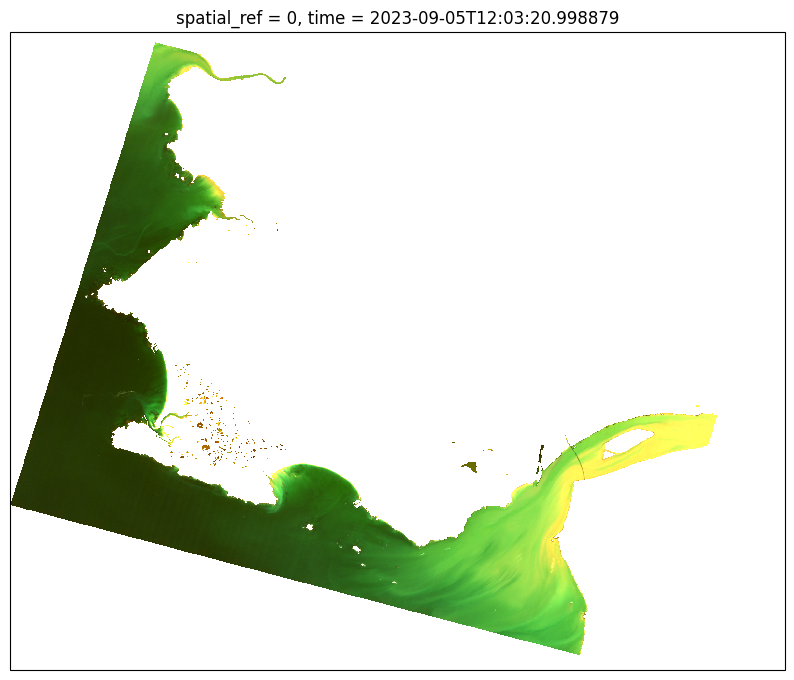

In [33]:
plt.figure(figsize=(10,10))
l2_prod.Rrs.sel(wl=[705,560,460],method='nearest').plot.imshow(rgb='wl',robust=True, subplot_kws=dict(projection= proj))

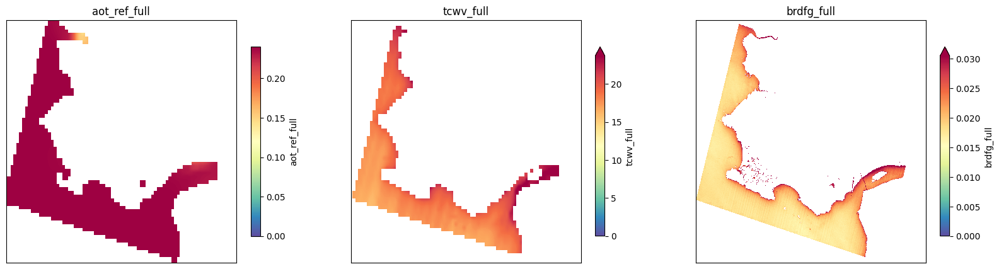

In [34]:
params=['aot_ref_full','tcwv_full','brdfg_full']

fig,axs = plt.subplots(1,3,figsize=(20,5))
axs=axs.ravel()

for i in range(len(params)):
    l2_prod[params[i]].plot.imshow(cmap=plt.cm.Spectral_r, robust=True,vmin=0,#vmax=0.201,
                               cbar_kwargs={'shrink': 0.78,'label':params[i]},ax=axs[i]) # extent=extent_val, transform=proj, 
    axs[i].set(xticks=[], yticks=[])
    axs[i].set_ylabel('')
    axs[i].set_xlabel('')    
    axs[i].set_title(params[i])    

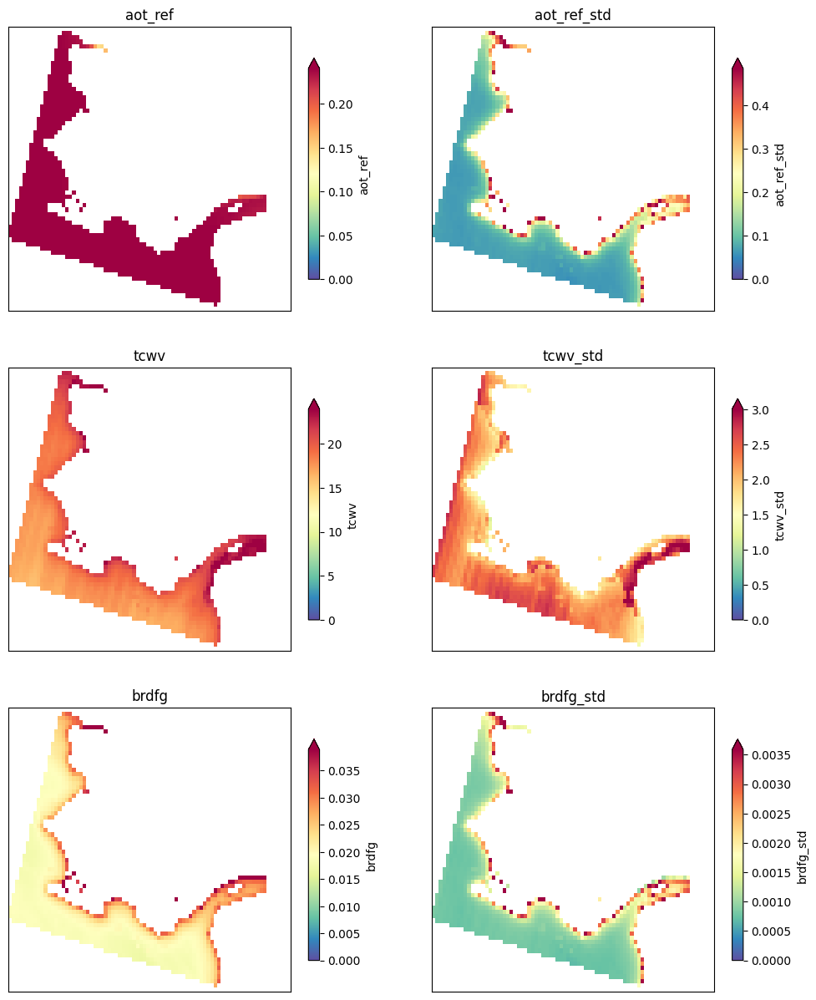

In [35]:
params=['aot_ref','aot_ref_std','tcwv','tcwv_std','brdfg','brdfg_std']

fig,axs = plt.subplots(3,2,figsize=(12,15))
axs=axs.ravel()

for i in range(len(params)):
    l2_prod[params[i]].plot.imshow(cmap=plt.cm.Spectral_r, robust=True,vmin=0,#vmax=0.201,
                               cbar_kwargs={'shrink': 0.78,'label':params[i]},ax=axs[i]) # extent=extent_val, transform=proj, 
    axs[i].set(xticks=[], yticks=[])
    axs[i].set_ylabel('')
    axs[i].set_xlabel('')    
    axs[i].set_title(params[i])    

In [41]:
import GRSl2bgen
owt_process = GRSl2bgen.OWT_process(l2_prod)

owt_process.execute()

INFO:root:OWT classification
INFO:root:success
INFO:root:construct xarray owt product
INFO:root:OWT classification
INFO:root:success
INFO:root:construct xarray owt product


In [42]:
owt_process.output.owt_dist_Bi2024


<xarray.DataArray 'owt_dist_Bi2024' (y: 1171, x: 1434)> Size: 7MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * x            (x) float64 11kB 6.314e+05 6.315e+05 ... 6.744e+05 6.744e+05
    spatial_ref  int64 8B 0
    time         datetime64[ns] 8B 2023-06-22T11:20:31.022526
  * y            (y) float64 9kB 5.063e+06 5.063e+06 ... 5.028e+06 5.028e+06

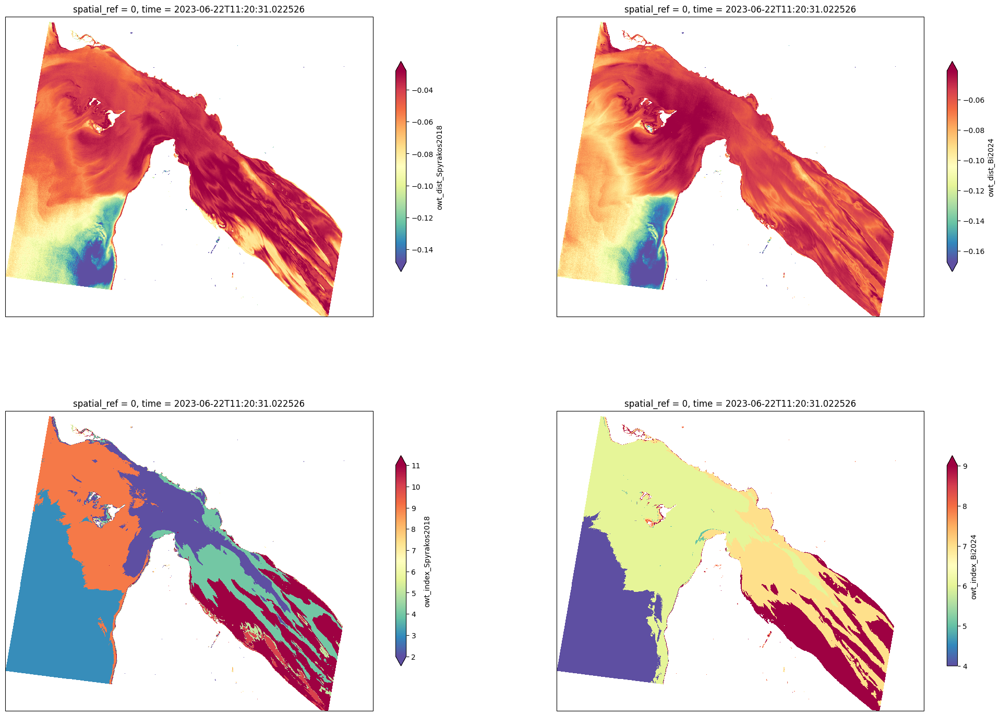

In [43]:


params = ['owt_dist_Spyrakos2018','owt_dist_Bi2024','owt_index_Spyrakos2018','owt_index_Bi2024']
raster = owt_process.output
fig = plt.figure(figsize=(25, 18))

for ii, param in enumerate(params):
    ax = plt.subplot(2,2, ii+1, projection=proj)
    raster[param].plot.imshow(robust=True,cmap=plt.cm.Spectral_r,cbar_kwargs={'shrink': 0.64},ax=ax)

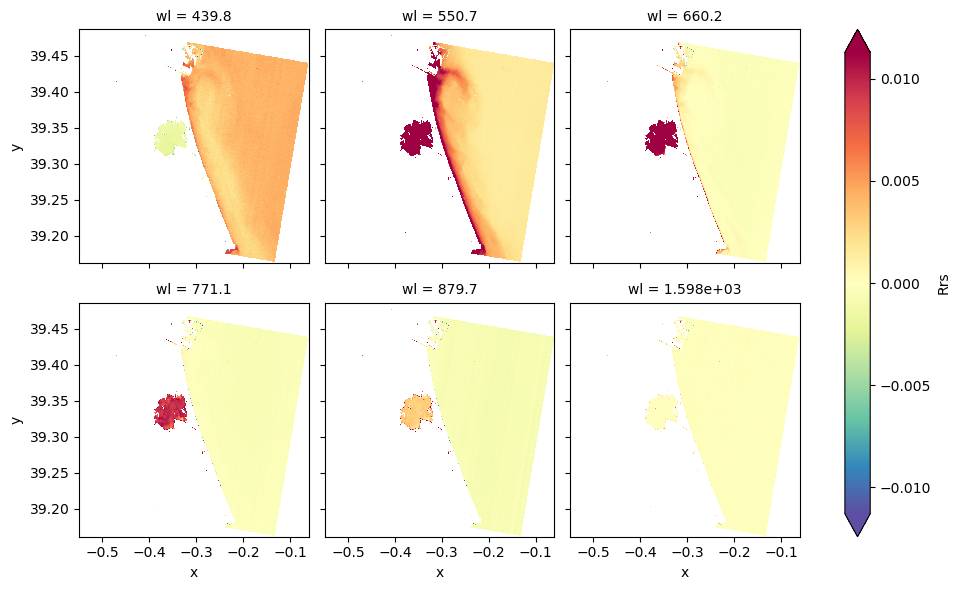

In [39]:

fig = Rrs_.Rrs.sel(wl=[440,550,660,770,880,1600], method='nearest').rio.reproject(4326).plot.imshow(
    col='wl', col_wrap=3, cmap=plt.cm.Spectral_r, robust=True
)
#plt.savefig(root_path+'figure_rtoa.jpg', format='jpg', dpi=300)
plt.show()

### Set output directory
The output L2A image will be saved in hte directory¶

In [40]:
odir='/data/satellite/prisma/zoffoli/L2A'
outfile = os.path.join(odir,l2a_name)

NameError: name 'l2a_name' is not defined

### Set CAMS file
CAMS file should cover the date of the image acquisition

In [ ]:
cams_file = "/data/cams/world/cams_forecast_2021-12.nc"

In [ ]:
process_ = hgrs.Process()
process_.execute(l1c_path,
                 l2c_path,
                 cams_file,
                 
                 )


Check the output L2A product (xarray.Dataset)

In [ ]:
process_.l2_prod

If you want to save the output L2A image into netcdf:

In [ ]:
process_.write_output(outfile)

### check L1C data

In [ ]:
coarsening=1
gamma=0.2
brightness_factor = 1
fig = (l1c_prod.Rtoa[:, ::coarsening, ::coarsening].isel(wl=[30,20,10])**gamma*brightness_factor).plot.imshow(rgb='wl',robust=True)#, subplot_kws=dict(projection= l1c.proj))
fig.axes.set(xticks=[], yticks=[])
fig.axes.set_ylabel('')
fig.axes.set_xlabel('')
fig

In [ ]:
### check L2A output

In [ ]:
#(Rcorr[:, ::coarsening, ::coarsening].isel(wl=[30,20,10])*brightness_factor).plot.imshow(rgb='wl')#, subplot_kws=dict(projection= l1c.proj))
coarsening=1

gamma=0.2
brightness_factor = 1
#fig = (process_.l1c_prod.Rtoa[:, ::coarsening, ::coarsening].isel(wl=[30,20,10])**gamma*brightness_factor).plot.imshow(rgb='wl',robust=True)#, subplot_kws=dict(projection= l1c.proj))
fig =(process_.l2_prod.Rrs[:, ::coarsening, ::coarsening].sel(wl=[670,550,490],method='nearest')).plot.imshow(rgb='wl',robust=True)#, subplot_kws=dict(projection= l1c.proj))ax=fig.axes,
fig.axes.set(xticks=[], yticks=[])
fig.axes.set_ylabel('')
fig.axes.set_xlabel('')
fig

In [ ]:
subset = process_.l2_prod.Rrs.sel(wl=[405,440,490,510,550,600,640,660,695,705,710,750],method='nearest')

fig = subset.plot.imshow(col='wl',col_wrap=4,vmin=0,robust=True,cmap=plt.cm.Spectral_r)
for ax in fig.axs.flat:
    ax.set(xticks=[], yticks=[])
    ax.set_ylabel('')
    ax.set_xlabel('')
fig

In [ ]:


param = 'Rrs'
raster = process_.l2_prod[param] 


#param = 'rho'
#raster = dc_l2c[param] 
cmap='Spectral_r'
#cmap='RdBu_r'
third_dim = 'wl'

wl= raster.wl.data
Nwl = len(wl)
ds = hv.Dataset(raster.persist())
im= ds.to(hv.Image, ['x', 'y'], dynamic=True).opts(cmap= cmap,colorbar=True,clim=(0,0.03)).hist(bin_range=(0,0.02)) 

polys = hv.Polygons([])
box_stream = hv.streams.BoxEdit(source=polys)
dmap, dmap_std=[],[]

def roi_curves(data,ds=ds):    
    if not data or not any(len(d) for d in data.values()):
        return hv.NdOverlay({0: hv.Curve([],'Wavelength (nm)', param)})

    curves,envelope = {},{}
    data = zip(data['x0'], data['x1'], data['y0'], data['y1'])
    for i, (x0, x1, y0, y1) in enumerate(data):
        selection = ds.select(x=(x0, x1), y=(y0, y1))
        mean = selection.aggregate(third_dim, np.mean).data
        std = selection.aggregate(third_dim, np.std).data
        wl = mean.wl

        curves[i]= hv.Curve((wl,mean[param]),'Wavelength (nm)', param) 

    return hv.NdOverlay(curves)


# a bit dirty to have two similar function, but holoviews does not like mixing Curve and Spread for the same stream
def roi_spreads(data,ds=ds):    
    if not data or not any(len(d) for d in data.values()):
        return hv.NdOverlay({0: hv.Curve([],'Wavelength (nm)', param)})

    curves,envelope = {},{}
    data = zip(data['x0'], data['x1'], data['y0'], data['y1'])
    for i, (x0, x1, y0, y1) in enumerate(data):
        selection = ds.select(x=(x0, x1), y=(y0, y1))
        mean = selection.aggregate(third_dim, np.mean).data
        std = selection.aggregate(third_dim, np.std).data
        wl = mean.wl

        curves[i]=  hv.Spread((wl,mean[param],std[param]))
        #curves[i].opts(fill_alpha=0.3)
    return hv.NdOverlay(curves)

mean=hv.DynamicMap(roi_curves,streams=[box_stream])
std =hv.DynamicMap(roi_spreads, streams=[box_stream])    
hlines = hv.HoloMap({wl[i]: hv.VLine(wl[i]) for i in range(Nwl)},third_dim )


hv.output(widget_location='top_left')

# visualize and play
graphs = ((mean* std *hlines).relabel(param))
layout = (im * polys +graphs    ).opts(
    opts.Curve(width=750,height=500, framewise=True,xlim=(400,1100)), 
    opts.Polygons(fill_alpha=0.2, color='green',line_color='black'), 
    opts.VLine(color='black')).cols(2)
layout 